In [1]:
import numpy as np
import tensorflow as tf
import cv2
from google.cloud import storage
import io
from PIL import Image

import sys, os, inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(2,parentdir) 
from model.image_utils import *

In [9]:
images = load_images_from_bucket(path='images/Cars/cars_train/')

In [10]:
#check the number of images 
len(images)

8126

In [11]:
#show an example image matrix 
images[0]

array([[[-0.34117647, -0.2       , -0.16862745],
        [-0.2627451 , -0.12156863, -0.09019608],
        [-0.45098039, -0.27843137, -0.23921569],
        ...,
        [ 0.9372549 ,  0.96862745,  0.97647059],
        [ 0.97647059,  1.        ,  1.        ],
        [ 0.9372549 ,  0.98431373,  0.98431373]],

       [[-0.34117647, -0.2       , -0.16862745],
        [-0.23137255, -0.09019608, -0.05882353],
        [-0.30196078, -0.15294118, -0.10588235],
        ...,
        [ 0.91372549,  0.98431373,  0.97647059],
        [ 0.90588235,  0.97647059,  0.96862745],
        [ 0.89803922,  0.94509804,  0.94509804]],

       [[-0.27843137, -0.1372549 , -0.11372549],
        [-0.35686275, -0.21568627, -0.18431373],
        [-0.31764706, -0.18431373, -0.1372549 ],
        ...,
        [ 0.89803922,  0.96862745,  0.96862745],
        [ 0.8745098 ,  0.95294118,  0.94509804],
        [ 0.90588235,  0.95294118,  0.95294118]],

       ...,

       [[ 0.35686275,  0.37254902,  0.28627451],
        [ 0

In [23]:
## Add noise
image_noise = add_noise(images, 1, 5)

[[ 0.0841266   0.00750061 -0.0675239  ...  0.04576533  0.09869657
   0.05661934]
 [-0.02536536  0.05113035 -0.08553209 ...  0.01242276 -0.01273653
   0.03320188]
 [-0.03341945  0.0516684  -0.0263241  ... -0.01841503  0.00239844
  -0.02513256]
 ...
 [ 0.11700842  0.02626562 -0.06176037 ... -0.02602035 -0.08916884
  -0.04224956]
 [-0.03183965  0.00455084 -0.04493409 ...  0.06033582 -0.07110177
   0.03824559]
 [-0.04721523 -0.02201036 -0.10135924 ... -0.02999839  0.06893999
   0.02544456]]
[[ 0.0072441  -0.10155099  0.0625916  ... -0.00800082 -0.07169125
   0.06746892]
 [-0.00933808 -0.05519687  0.07109334 ...  0.06889235  0.00744481
  -0.04371585]
 [-0.04709271  0.05396959 -0.0075296  ...  0.02685486 -0.03104869
  -0.08859435]
 ...
 [-0.01322486  0.07029795  0.04698201 ...  0.10173295 -0.01031748
   0.03016574]
 [-0.09622695  0.01543467 -0.09617982 ...  0.059669   -0.00310773
  -0.06269849]
 [-0.01691643 -0.01458139 -0.05199262 ... -0.00690608  0.03968445
   0.10628553]]
[[-0.04321616  0

[[-0.05896218  0.00054686 -0.03191108 ... -0.01751943 -0.12442732
   0.11679852]
 [-0.01509946  0.02170029 -0.03079613 ...  0.03987975 -0.04081954
  -0.04399951]
 [-0.08160863 -0.02226277 -0.10172219 ...  0.03793268  0.00442855
  -0.05066132]
 ...
 [-0.06070971  0.04381605  0.06091399 ...  0.00932042  0.03689753
   0.06734575]
 [-0.10003416  0.09651475 -0.03970116 ...  0.0035065  -0.00854449
  -0.01361796]
 [ 0.06942338  0.04804415  0.09697884 ...  0.02942759  0.01105188
   0.01528989]]
[[ 0.02484822 -0.1075932  -0.00275658 ...  0.12487591 -0.07131334
   0.02130852]
 [-0.03196195 -0.04099293 -0.05559355 ... -0.03200724 -0.03729951
  -0.05124697]
 [ 0.03470435 -0.04242306  0.02491447 ...  0.05759391  0.09816724
  -0.08772397]
 ...
 [ 0.05838584 -0.02983096 -0.03481886 ... -0.09930779  0.10293412
  -0.01120555]
 [-0.05878983 -0.04148941 -0.15601329 ... -0.01754273 -0.03224278
  -0.04006563]
 [ 0.03000392  0.09913394 -0.00879581 ...  0.06690881 -0.0205754
  -0.01511128]]
[[-0.03663095 -0.

[[ 0.00350253  0.05051201 -0.0656012  ...  0.09981892 -0.02276548
   0.05645965]
 [-0.02923509  0.0663461  -0.01277366 ... -0.00283554  0.06716934
   0.01886022]
 [ 0.01085982 -0.02788855 -0.02264375 ...  0.01629373 -0.05931976
  -0.04296824]
 ...
 [-0.05127418 -0.04630086  0.02444587 ... -0.05888228 -0.01858046
   0.00461793]
 [ 0.07879059  0.07252438 -0.01993353 ... -0.01197748 -0.04972508
  -0.099631  ]
 [ 0.02526395 -0.02483307 -0.02966986 ... -0.01044008  0.00097224
   0.07232746]]
[[ 0.05113936 -0.07965022  0.02373507 ... -0.00166212 -0.06001629
   0.01184954]
 [ 0.02808763  0.09323723 -0.01577395 ... -0.03726877  0.05217564
  -0.02737955]
 [-0.06055266 -0.06028606  0.01056085 ...  0.05117118 -0.06939866
   0.01053422]
 ...
 [-0.04774702  0.04733838  0.02013235 ...  0.00830148  0.09294414
   0.01263799]
 [ 0.04915816  0.11564502  0.03296144 ... -0.05215145  0.0131025
   0.15430337]
 [ 0.05001629  0.10099078 -0.02926619 ...  0.00247108  0.12932464
   0.01490187]]
[[ 0.03584024 -0.

[[-0.01899984 -0.03709169 -0.02127429 ... -0.03604663 -0.05179891
   0.00358492]
 [ 0.01654338 -0.0783887   0.01048434 ...  0.05864501  0.04377817
  -0.00298521]
 [ 0.03984769 -0.05866937  0.14655115 ... -0.05913369 -0.00435092
   0.02550293]
 ...
 [-0.03711874  0.08686614  0.03672665 ... -0.05852998 -0.03142866
  -0.05861743]
 [ 0.04797858  0.00997753 -0.04820316 ...  0.04492646 -0.01830715
  -0.09434651]
 [ 0.0351806  -0.02016954 -0.0227229  ...  0.02650341 -0.0531095
  -0.00335429]]
[[ 6.36654535e-02 -1.76413642e-02 -7.08656219e-02 ...  3.89517578e-02
  -3.04452455e-02 -5.12655391e-02]
 [ 1.30729719e-02 -2.38613133e-02  9.59484482e-02 ... -1.07047901e-02
   1.05452235e-02  5.61659161e-02]
 [ 1.26185915e-02  5.25035792e-02  4.78010676e-04 ... -4.87830126e-02
  -2.22228251e-02  2.17762866e-03]
 ...
 [-4.54337245e-02 -3.13642742e-02 -4.28035749e-02 ...  3.67997896e-05
  -4.68329946e-02 -2.44462134e-02]
 [-3.31063217e-02  6.97072854e-02  5.31600809e-02 ... -3.09516534e-02
   5.33650216e

[[-0.03668533  0.04677351  0.0159686  ... -0.00608281  0.00756629
  -0.04821747]
 [-0.06531776 -0.00034886 -0.00446054 ... -0.0262368   0.00165636
   0.02968753]
 [ 0.00601872 -0.08853568 -0.04223481 ...  0.03485768  0.04228268
   0.06932902]
 ...
 [ 0.01171266 -0.0731887  -0.09650259 ...  0.03531152 -0.03946278
  -0.05452034]
 [-0.00838189 -0.05903692 -0.16336958 ...  0.00851413 -0.00355994
   0.00665854]
 [-0.00459039  0.08257719 -0.03145071 ... -0.02030557 -0.05974001
  -0.07288764]]
[[-0.01425465 -0.05235528 -0.0690829  ...  0.0435441   0.05401807
  -0.05196705]
 [ 0.03978655  0.08127578  0.06817816 ... -0.04555636 -0.04234502
   0.02006548]
 [ 0.02152134  0.06797666  0.03656619 ... -0.02333383 -0.00987248
  -0.03152047]
 ...
 [ 0.12132853 -0.11362804 -0.01158726 ...  0.06095918 -0.0237719
  -0.06167607]
 [ 0.0689798  -0.06303444  0.01212125 ... -0.05916333  0.04251148
  -0.03609077]
 [-0.05565512 -0.10464878 -0.07188496 ... -0.02302921 -0.08308656
   0.02082011]]
[[ 0.02632344 -0.

[[ 0.00868493  0.00149034 -0.03121878 ...  0.05260114  0.00400948
   0.01848627]
 [ 0.00182647  0.06904426 -0.00620456 ...  0.02797646  0.08831077
   0.05897539]
 [-0.07742948  0.02324734 -0.05828727 ...  0.08290288 -0.03649484
  -0.02021287]
 ...
 [ 0.00784916 -0.03462133  0.02968469 ...  0.04171968  0.10249179
  -0.00047684]
 [-0.00150319  0.01281601  0.07963344 ...  0.07963292 -0.01272675
   0.02571078]
 [ 0.03986998 -0.0266962  -0.07718291 ...  0.02714584  0.10669477
  -0.04002171]]
[[-0.02097767  0.02387711 -0.03593811 ... -0.02091203  0.07926137
   0.02169924]
 [-0.00463659  0.00431339 -0.02832605 ... -0.0056137   0.00097449
  -0.02303339]
 [-0.04581806 -0.03436421 -0.00711809 ... -0.00307415 -0.0648348
   0.05831099]
 ...
 [ 0.0093619   0.03349842 -0.02917389 ...  0.0847967   0.09102299
   0.02409787]
 [ 0.09224309  0.02114638 -0.03944677 ...  0.02612595  0.01806019
  -0.07330132]
 [ 0.03632895  0.08116581 -0.00719858 ... -0.04774583 -0.01217825
   0.08185555]]
[[ 0.02262424 -0.

[[-0.057275    0.00740543  0.05918729 ... -0.01171239  0.03779031
   0.00204444]
 [-0.01875935 -0.0052289   0.00388167 ... -0.0188688  -0.09912347
  -0.0292998 ]
 [ 0.05337477  0.03357539 -0.08349744 ... -0.0392236   0.02373857
  -0.0664453 ]
 ...
 [-0.02405448 -0.04799213 -0.04752876 ... -0.02832624 -0.04070539
   0.02518785]
 [-0.01729282 -0.08228563 -0.00320021 ...  0.03367707  0.10408248
  -0.00406903]
 [ 0.02459843 -0.11116706 -0.0492507  ... -0.08002376 -0.01643145
   0.03460793]]
[[ 3.16512435e-02 -3.84465986e-02  3.98447328e-02 ...  1.84940326e-02
  -4.21736470e-02  2.51366494e-02]
 [-7.47339873e-02 -4.50444527e-02  7.05568696e-02 ...  3.52468332e-02
   2.97582814e-02 -3.15584964e-02]
 [ 2.42863801e-02 -1.95118434e-02 -1.65794173e-02 ...  4.35097211e-02
   5.31483271e-02 -8.92087661e-05]
 ...
 [-5.86011212e-04  5.42917176e-02 -2.18110552e-02 ...  6.44129168e-03
   5.42651443e-02 -2.16090407e-02]
 [-7.76089655e-02 -5.33042880e-02 -1.52885964e-02 ... -1.43361556e-02
  -6.39385575

[[ 0.0035528  -0.05575404 -0.06777093 ...  0.02320636 -0.03273041
  -0.08480147]
 [ 0.03591401 -0.01133616 -0.07715756 ... -0.08032086  0.01016269
   0.10867661]
 [-0.10406906 -0.07101569  0.02543152 ...  0.02447279 -0.02802313
  -0.02219246]
 ...
 [ 0.06690957 -0.04172623  0.04192101 ...  0.06682465 -0.01569889
  -0.01086281]
 [ 0.02819359  0.09992816 -0.01652914 ...  0.05149599  0.02045526
  -0.02552784]
 [ 0.00053737 -0.06179997 -0.12071674 ...  0.0220494   0.00462125
  -0.0054328 ]]
[[-0.04014063 -0.00090733  0.01722944 ...  0.01557744  0.03429434
   0.03787858]
 [ 0.03410142  0.02882133 -0.0333186  ... -0.04219493  0.00051883
  -0.05377361]
 [-0.0060904   0.04664878 -0.03313135 ... -0.01438206  0.0713988
   0.03868264]
 ...
 [-0.0074239  -0.03599808  0.02082797 ...  0.03717239 -0.0151908
  -0.01032628]
 [-0.01646353  0.04262536  0.00221852 ... -0.0409082   0.00655279
  -0.03164053]
 [ 0.09908421  0.01239988 -0.02482218 ...  0.00712065  0.05416307
  -0.03475147]]
[[-0.10626583  0.0

[[ 0.00134414  0.11525968  0.02160717 ...  0.03100126  0.07286074
   0.03403663]
 [ 0.07818608  0.03925929 -0.00910238 ... -0.01712577 -0.00710698
   0.11552551]
 [-0.03949448  0.01765653 -0.01397388 ...  0.040518   -0.04926618
  -0.04609624]
 ...
 [-0.05809775  0.05354364  0.05120757 ...  0.08633813 -0.04331451
   0.09964468]
 [ 0.00231156  0.00706162  0.06010247 ...  0.00943344 -0.0275562
  -0.07084182]
 [-0.02624752 -0.00888548  0.00371144 ...  0.03616287 -0.10785881
  -0.05521392]]
[[-0.05636617  0.0379885  -0.03039142 ... -0.01363869 -0.05262038
  -0.06007281]
 [-0.08858888 -0.06367391  0.03964648 ... -0.06628901 -0.09821534
  -0.01374708]
 [ 0.0113182   0.01748943  0.04061515 ...  0.05526754 -0.09104165
   0.04633322]
 ...
 [-0.00201364  0.0588836  -0.00010173 ...  0.01136044  0.00622416
  -0.05610097]
 [-0.01908825 -0.07655847 -0.07429012 ...  0.06763559  0.01983444
  -0.03954557]
 [-0.01114842  0.03757571 -0.00042652 ... -0.02448144  0.0179657
  -0.01288517]]
[[-0.02816602 -0.0

[[-0.03591777  0.07887792 -0.01947589 ... -0.07260696 -0.04828573
   0.05293829]
 [ 0.08025657 -0.0177695  -0.09207032 ... -0.0495324  -0.06447894
   0.03460737]
 [ 0.02015267 -0.0218187  -0.00974889 ... -0.03787373  0.02356445
  -0.02080281]
 ...
 [-0.02198277 -0.0969162   0.01040459 ...  0.01226735  0.01289303
   0.06493805]
 [ 0.02231542 -0.11014557  0.04525793 ...  0.00147483  0.0109034
   0.03112837]
 [-0.03864666  0.03563085  0.05185235 ... -0.02503302  0.02241943
  -0.00077994]]
[[-0.0680567   0.0156922  -0.04199726 ... -0.00511737  0.01832283
   0.01614523]
 [-0.06106791 -0.00088046 -0.04956118 ... -0.07265975  0.04010245
  -0.02346649]
 [ 0.05434595  0.03153333  0.01669217 ...  0.02268176 -0.03878822
   0.00868491]
 ...
 [-0.02746707  0.0370213  -0.02140497 ...  0.03582544  0.09954858
   0.01368897]
 [-0.01436744 -0.00157206  0.06249614 ...  0.02952384 -0.03183332
  -0.05910168]
 [ 0.07434097  0.02142877  0.00664872 ...  0.00120321  0.04566486
   0.08578121]]
[[ 0.02682883 -0.

[[ 0.00756417 -0.04923139 -0.09137619 ...  0.04302195  0.04870176
   0.02823576]
 [ 0.01439501 -0.02016331 -0.02250701 ... -0.05900274  0.04496924
  -0.03571679]
 [-0.01406314  0.0651772   0.01914798 ... -0.11184655  0.04770937
   0.02045328]
 ...
 [ 0.05047532 -0.10711945 -0.03920368 ... -0.02868554  0.01889759
   0.00347788]
 [-0.02404388  0.00942824  0.01237667 ...  0.04168148 -0.02564043
  -0.04028298]
 [-0.11791065  0.04854607  0.05372484 ... -0.00417198  0.01652355
  -0.00415144]]
[[ 0.04331665  0.00748991  0.01379136 ...  0.01899067  0.00318758
  -0.09291009]
 [-0.01882926  0.02690739  0.05502674 ...  0.01423323 -0.02851488
   0.15825934]
 [ 0.01112325 -0.04806626  0.00945481 ... -0.01876517  0.06917685
   0.08817062]
 ...
 [ 0.05763032  0.08452873  0.00355527 ...  0.05065298  0.02276029
  -0.00530798]
 [-0.1204481  -0.01015418  0.00428184 ...  0.07815125  0.03852945
   0.00390382]
 [-0.0221338   0.04388198 -0.05301008 ...  0.05963735  0.01738198
  -0.15249463]]
[[ 0.01126932 -0

[[-0.01204087  0.06372917  0.00460423 ...  0.04089221  0.02471443
   0.01495809]
 [ 0.04693474  0.03202876 -0.05836044 ... -0.01913721 -0.01436776
  -0.0069059 ]
 [ 0.06255388 -0.03389194  0.08859672 ...  0.10928974 -0.00435304
  -0.01327537]
 ...
 [ 0.02539643 -0.08474576  0.03658464 ...  0.0061313   0.02034253
   0.02271815]
 [-0.01232871 -0.07533854  0.03197576 ... -0.03564934  0.04168829
  -0.09343392]
 [ 0.03389838 -0.09246947 -0.07914526 ... -0.02232644  0.02491973
  -0.08179671]]
[[-0.01618358 -0.11048401  0.00292001 ...  0.0574504   0.00963987
   0.01004706]
 [-0.01866962 -0.05393105 -0.05699914 ... -0.03626477 -0.02470727
  -0.04648384]
 [-0.00618896  0.01146259  0.07516264 ... -0.06141311  0.08259401
   0.12956902]
 ...
 [-0.03513333 -0.01594526 -0.04382352 ... -0.09619756 -0.07837765
  -0.0447437 ]
 [-0.09109368 -0.03560583 -0.09887527 ... -0.01148093  0.0155321
  -0.01232647]
 [ 0.14462407 -0.04160126 -0.02601183 ...  0.04732153  0.01390589
  -0.11051827]]
[[ 0.04836786  0.

[[ 0.0691744   0.01728897  0.0061427  ...  0.08119527 -0.00190811
   0.08254799]
 [ 0.06194362  0.01158924 -0.10289832 ... -0.08707122 -0.01527973
  -0.00992815]
 [-0.01041756  0.03679287  0.04184737 ...  0.00086825  0.00430916
  -0.00814741]
 ...
 [ 0.00070545  0.05896124  0.07624398 ...  0.00134081 -0.09227727
   0.05632628]
 [ 0.02527602  0.07756605  0.14014167 ...  0.02830013  0.00936507
   0.01770905]
 [-0.0232253   0.05802737  0.04316223 ...  0.05244532  0.05555389
   0.03811039]]
[[ 0.01217678 -0.00787649 -0.10313631 ... -0.11487025  0.0134117
  -0.0769586 ]
 [ 0.04016575 -0.0335919  -0.06795882 ... -0.00643161  0.01609423
   0.00267912]
 [-0.08463405 -0.05453253  0.05568292 ...  0.04660766 -0.07255684
   0.00279267]
 ...
 [ 0.0302608   0.01985903 -0.01051921 ...  0.03387493 -0.04369815
   0.00439018]
 [ 0.08518391  0.10451991 -0.00618078 ... -0.01989835  0.00346224
   0.09230335]
 [-0.04534373  0.03298101 -0.04187913 ...  0.0069694   0.01119023
   0.00380754]]
[[-0.06354316  0.

[[-0.02694246  0.00620769 -0.06981256 ... -0.05477197  0.008532
   0.008553  ]
 [ 0.05054631  0.10254148 -0.08470557 ... -0.00785358 -0.01822849
  -0.01924612]
 [-0.09726429 -0.0288896   0.12628287 ... -0.00744748 -0.07638599
   0.06236604]
 ...
 [ 0.0847557  -0.06977813  0.03529294 ...  0.08417751  0.05169112
   0.03451781]
 [ 0.04511915  0.0001578   0.00119607 ...  0.04041941 -0.0820256
   0.00370636]
 [ 0.01902449  0.0379429  -0.09337816 ...  0.04156931  0.05998543
   0.00372415]]
[[-0.07424955 -0.01221721 -0.08377852 ...  0.03507546  0.0391728
   0.01235213]
 [ 0.02597628  0.07864549  0.03216342 ...  0.04809772  0.06435468
   0.07042806]
 [ 0.02032075 -0.00884623  0.00240875 ... -0.09056873  0.03090915
   0.03098022]
 ...
 [-0.02401107 -0.00425579 -0.03109552 ... -0.02400423  0.02652353
   0.00933009]
 [ 0.02467995  0.08230276  0.06812954 ... -0.01707835  0.07321434
   0.01161054]
 [-0.04666867 -0.01828973  0.01448973 ...  0.03756249 -0.03592642
  -0.0300124 ]]
[[ 0.07631317 -0.098

[[-5.54724258e-02 -1.39305863e-02 -8.27379157e-02 ...  2.33707676e-02
   4.01213052e-02 -2.10879487e-02]
 [-8.64927920e-02  3.63065656e-02  7.70864362e-02 ... -4.46261337e-02
  -1.79727565e-02  4.47319958e-02]
 [ 3.10143128e-02  2.20926934e-02  4.15073820e-02 ...  9.76822460e-02
   3.47762626e-02  5.40594429e-02]
 ...
 [-5.19500714e-02  8.80343290e-02 -3.78062101e-03 ... -9.65670968e-02
  -3.70332407e-02 -3.86485490e-05]
 [ 7.60329235e-03  5.05623410e-02  5.42991448e-02 ...  2.81104956e-02
   6.25190975e-02  4.63712563e-02]
 [ 7.37153446e-02  7.54710882e-02 -6.14200877e-02 ... -4.97997913e-02
   9.64551654e-02  1.14903973e-01]]
[[ 0.00089744  0.04472004 -0.00958981 ...  0.00721816  0.02042285
  -0.02071629]
 [ 0.06785948 -0.08043853  0.01960787 ...  0.0069233   0.07014942
   0.0811243 ]
 [ 0.05668521  0.07069883 -0.03508977 ... -0.03130266  0.01989639
   0.01944138]
 ...
 [ 0.04854698  0.06291434  0.08471999 ... -0.00630861  0.02455778
  -0.01917251]
 [ 0.00897009  0.04517211  0.021346

[[-0.03711841 -0.03305943  0.11076227 ... -0.00254416 -0.01103197
  -0.03416576]
 [-0.01092965  0.08144761 -0.04266886 ... -0.00232565  0.01067583
  -0.00128475]
 [ 0.00963567 -0.03556924  0.05210905 ...  0.04945805  0.0130278
  -0.00015857]
 ...
 [ 0.04530617 -0.08134297  0.04784213 ... -0.00328972  0.00483704
   0.01701313]
 [-0.02399334 -0.01296593  0.06653666 ... -0.01870587 -0.03912481
  -0.03974819]
 [-0.08728547  0.00169062  0.0086689  ...  0.02225965  0.10857113
   0.04018281]]
[[-0.00431252 -0.01893985 -0.03726383 ... -0.03501299  0.00358358
   0.02872115]
 [-0.00154437  0.01379827  0.10665975 ...  0.04410179 -0.01448914
  -0.00724144]
 [-0.03101209 -0.08281079 -0.00791873 ...  0.07909227  0.00677137
  -0.0700484 ]
 ...
 [ 0.03397847 -0.00183032  0.00406316 ...  0.00678695  0.02432723
  -0.06626881]
 [-0.01152835 -0.05577441  0.00916189 ...  0.05342901  0.06836864
   0.04831352]
 [-0.00740808  0.01035265 -0.02705592 ...  0.05745205 -0.05017964
  -0.07154991]]
[[ 3.36221594e-02

[[ 4.06465214e-02  3.12606933e-02  1.72438774e-04 ...  6.90219624e-02
   4.29555751e-02  8.28849466e-02]
 [-1.00533778e-03  6.28659945e-02 -8.44940116e-02 ...  9.17886508e-02
  -2.62878268e-02  4.92015590e-03]
 [ 2.85290957e-02  4.46256659e-02 -1.02416333e-02 ...  1.07211395e-02
  -3.94054714e-02 -2.16456316e-02]
 ...
 [-6.02112002e-03 -5.17967838e-02 -1.13936575e-02 ...  1.17227620e-01
  -8.45421270e-02  1.86859701e-02]
 [-8.30893147e-02 -1.18820049e-02  6.14143701e-02 ...  4.59106022e-02
   6.69663076e-02  4.21779029e-02]
 [ 4.27618988e-03 -7.62621642e-05  7.07007538e-02 ...  2.64097360e-02
   1.19486390e-02  6.43902292e-02]]
[[-0.12815259 -0.08317636  0.00147883 ...  0.01796336  0.01363437
  -0.02518883]
 [-0.06153541 -0.00158562 -0.041026   ... -0.02570681 -0.06300165
  -0.00995055]
 [ 0.02578962 -0.0078382   0.01048613 ... -0.0350946  -0.06423068
   0.00757899]
 ...
 [ 0.0297354  -0.04851729 -0.05220982 ... -0.05538278 -0.0086089
  -0.01823922]
 [ 0.05503386  0.03672578 -0.0247212

[[ 0.13610319  0.04375246  0.03308791 ...  0.08479     0.07705895
  -0.05095574]
 [-0.00931735  0.01093445  0.0033193  ... -0.02127356 -0.02919506
   0.0203123 ]
 [-0.03884169  0.05923174 -0.00058852 ... -0.03067018 -0.02030373
  -0.03555693]
 ...
 [ 0.00030284  0.02774188 -0.02770418 ...  0.04735113  0.00610134
  -0.02159539]
 [ 0.04385382  0.0659859   0.02727869 ... -0.11391185 -0.04473562
  -0.02575178]
 [-0.04579675  0.0077228  -0.01514276 ...  0.01388477 -0.08570442
  -0.07316571]]
[[-0.01821023  0.01556509  0.04657737 ... -0.00776561  0.08721335
  -0.05298059]
 [ 0.05632604 -0.10706744 -0.06291477 ...  0.06990883  0.04677628
  -0.02726071]
 [ 0.03309437  0.00922724 -0.02944256 ...  0.03921323  0.03258889
  -0.01717244]
 ...
 [-0.0304534  -0.05219097 -0.0226871  ...  0.03244864 -0.07522036
   0.00788196]
 [ 0.05988403 -0.00640692 -0.02447573 ...  0.0464129   0.02011979
  -0.01054445]
 [-0.03483238  0.06899216 -0.01518424 ...  0.00408398 -0.00047541
  -0.04543804]]
[[ 9.07190972e-0

[[-0.00650016 -0.03985121 -0.04545669 ... -0.1153043   0.0623785
  -0.03678978]
 [ 0.02698218  0.08101387 -0.07266306 ...  0.06656422 -0.02979559
   0.05418567]
 [-0.01140668  0.05618672 -0.01043162 ... -0.02920711  0.04191905
  -0.01177476]
 ...
 [ 0.11033971 -0.03857002  0.07250406 ...  0.0099429   0.01334649
   0.0399859 ]
 [ 0.07955711  0.03870051  0.08869397 ... -0.04333491 -0.02487232
   0.04428679]
 [ 0.04546213 -0.06725618  0.01411064 ... -0.01818626  0.03397408
   0.01070322]]
[[-0.00894618  0.09051907 -0.00325061 ... -0.05283979 -0.06756361
   0.05132003]
 [-0.03034199 -0.02503869 -0.01195305 ...  0.09228771 -0.04577012
   0.00882834]
 [ 0.02520161 -0.05696783  0.03979851 ... -0.023938   -0.02808602
   0.02926867]
 ...
 [-0.04364024 -0.11738344  0.06327326 ... -0.01186582  0.04706874
  -0.08075812]
 [-0.04332918 -0.03846918 -0.01367287 ... -0.00479668 -0.0009952
   0.01507463]
 [ 0.03398616 -0.04721884  0.10652703 ... -0.0212734  -0.02697153
   0.03602619]]
[[-0.00449961  0.0

[[ 0.0110994   0.05355263 -0.00847546 ...  0.0048626  -0.07803253
   0.10308629]
 [ 0.01765467  0.0152884  -0.03439883 ...  0.01511311  0.03292299
  -0.0143195 ]
 [ 0.04300813  0.05494033 -0.05362865 ... -0.07405663  0.03768415
   0.00357745]
 ...
 [-0.04324182 -0.00613189  0.05589645 ...  0.01146032 -0.04100518
   0.0501133 ]
 [ 0.02190232 -0.0692326   0.02067737 ... -0.06411304 -0.02235967
   0.03576397]
 [ 0.04898104  0.02491073 -0.01635598 ... -0.12434613  0.05953987
   0.02519742]]
[[ 0.06337372  0.01095056  0.0059037  ... -0.00357738  0.08783643
  -0.03566656]
 [ 0.05580966 -0.01254226 -0.01403962 ...  0.01285092  0.03411484
  -0.02933438]
 [ 0.00699962  0.06809542  0.03656861 ... -0.0256957  -0.00420234
  -0.02491684]
 ...
 [ 0.05487441 -0.13487423  0.01675914 ...  0.01096611  0.0804957
   0.01431213]
 [-0.09265231 -0.0163696  -0.04616535 ... -0.0156175  -0.09189856
  -0.11411625]
 [-0.02995523  0.0829803   0.04053725 ... -0.04098814 -0.02502491
  -0.0305536 ]]
[[-0.00860332 -0.

[[-0.00426363 -0.02801776 -0.03742898 ... -0.02222819 -0.03126667
  -0.09812895]
 [-0.05805188  0.00788012  0.06232386 ...  0.02528992 -0.07377748
   0.11717866]
 [-0.02771291  0.01821857  0.02859853 ...  0.00152415 -0.03251791
   0.00348327]
 ...
 [ 0.05178702 -0.02097432 -0.00561338 ...  0.01240328 -0.07163674
   0.03413062]
 [ 0.0496046   0.03643718 -0.04357746 ... -0.05361991  0.01856297
   0.04250446]
 [ 0.10598047  0.00217081 -0.01098575 ... -0.01227294 -0.01984118
   0.05051003]]
[[ 0.07214222  0.00528293 -0.04938539 ... -0.01551828 -0.00694817
   0.04999961]
 [-0.02678731 -0.05064607 -0.01545945 ... -0.00505121 -0.01710951
  -0.02587433]
 [ 0.03086665  0.01262139  0.04190261 ...  0.0216244  -0.01864548
  -0.02580103]
 ...
 [-0.01895689 -0.03158876 -0.08598882 ... -0.02819889  0.04196451
  -0.07605402]
 [ 0.08292875 -0.03747135  0.04685218 ... -0.01919637  0.00299654
  -0.07318219]
 [-0.05239503 -0.03159148 -0.00905976 ... -0.01146025  0.04756735
  -0.0249099 ]]
[[ 0.0316003   0

[[ 0.09152872 -0.01457716 -0.05947637 ... -0.0725914   0.00977216
  -0.01112679]
 [-0.00805198  0.06697435 -0.03041794 ... -0.10889339 -0.03888027
   0.03940053]
 [ 0.02589091  0.05883866 -0.05627931 ... -0.05036969 -0.03908675
  -0.00195049]
 ...
 [-0.026869   -0.01797904  0.00017595 ... -0.01603439 -0.07982104
  -0.0967595 ]
 [ 0.00412797  0.0227143   0.02663686 ... -0.00824816  0.01609017
   0.0270317 ]
 [ 0.05165003  0.08317781  0.00924647 ... -0.00792722  0.0301056
   0.04173165]]
[[-0.07064797 -0.09392904  0.02940381 ...  0.02329364 -0.03303741
  -0.03307427]
 [ 0.09945087 -0.03381522 -0.01627269 ...  0.02170982 -0.04712657
   0.02934956]
 [ 0.02576782  0.01701778  0.04557948 ... -0.07969065 -0.08249728
   0.01114906]
 ...
 [-0.09487637  0.07805679 -0.00053681 ... -0.00992952 -0.00438287
  -0.01160693]
 [ 0.00183478 -0.02827451 -0.01603104 ...  0.11829978  0.08087957
  -0.00815706]
 [ 0.03764419  0.038754    0.05627596 ...  0.01947232  0.01054489
  -0.02428792]]
[[-0.0178071   0.

[[-0.08001541  0.03636993 -0.05995703 ...  0.05565822 -0.01215728
  -0.0076346 ]
 [ 0.04250422  0.02722524 -0.02666203 ... -0.01196551  0.06014821
   0.01395973]
 [ 0.04075225 -0.0336095  -0.04522851 ...  0.02657654  0.0414171
   0.08048462]
 ...
 [-0.05537056 -0.02973831 -0.09357849 ... -0.11752125  0.08211567
  -0.00438318]
 [ 0.0436451   0.00156723 -0.05285655 ... -0.03052656  0.06810121
  -0.01197188]
 [ 0.03402663 -0.02740826 -0.0377497  ...  0.06362178  0.10348314
  -0.0126551 ]]
[[-0.01836037  0.03137742 -0.01873542 ... -0.1062333   0.00825867
  -0.01432139]
 [-0.04693977 -0.00631391  0.00011328 ...  0.01411411 -0.05364011
   0.00339978]
 [ 0.08279552 -0.05872987 -0.03233288 ... -0.00329555  0.06509889
  -0.00645594]
 ...
 [-0.01249199 -0.07465331 -0.04412859 ... -0.00574383 -0.03749805
   0.06561312]
 [-0.02991141  0.04350231  0.02464224 ...  0.00585385 -0.06273151
  -0.03479842]
 [-0.01721364  0.05998984  0.09111461 ... -0.05146771  0.03315925
  -0.00260328]]
[[-0.05605715  0.

[[-0.0114644   0.03257463 -0.01379223 ... -0.00920799  0.05449313
   0.05050955]
 [ 0.08740446  0.00113289 -0.02843069 ... -0.09002548  0.08914903
   0.06881557]
 [-0.05223428 -0.08015615 -0.08025203 ...  0.03041466  0.00229677
  -0.01637674]
 ...
 [-0.03313751 -0.02546863 -0.00402655 ...  0.01637705  0.01273399
  -0.00038943]
 [-0.06365985 -0.03656809 -0.00335951 ...  0.01515669  0.01175066
  -0.05520386]
 [-0.00667452  0.0086288  -0.01505012 ...  0.07596334  0.0669022
  -0.01729345]]
[[ 0.02712058 -0.01994535  0.04266481 ... -0.0188936   0.03103802
  -0.09194873]
 [-0.0535274   0.02150292 -0.06325599 ...  0.03554066  0.03766486
   0.03429855]
 [ 0.00182178 -0.01983426 -0.02760782 ...  0.04377571  0.02585733
  -0.02373441]
 ...
 [-0.06544374  0.07660565  0.01609209 ...  0.0106742  -0.07532095
  -0.02009089]
 [-0.00609302  0.01776586  0.02441143 ... -0.04896246  0.02178058
   0.02083223]
 [-0.05022975  0.00913748  0.07146157 ... -0.05413788  0.07522553
   0.00112506]]
[[ 0.01262488  0.

[[-0.05789911  0.04698113 -0.07060621 ...  0.11616111 -0.02850989
  -0.03531291]
 [-0.00239704 -0.00237272  0.09446197 ... -0.00435421 -0.03043538
  -0.03032602]
 [-0.01217863  0.00547488  0.02404035 ... -0.02384614  0.00335534
   0.02912073]
 ...
 [-0.00527821  0.0314054   0.09469768 ...  0.04572496 -0.00109845
  -0.07648593]
 [-0.08422202  0.04968548  0.03086093 ...  0.01197523 -0.00461481
  -0.03759267]
 [ 0.03415542  0.05400367  0.07706797 ...  0.01955624 -0.07608618
  -0.02309731]]
[[-0.06845     0.03204152 -0.0388314  ... -0.02795506  0.10026551
  -0.13433138]
 [ 0.03473666  0.10709194 -0.0358153  ...  0.06418299 -0.0245291
   0.01335553]
 [ 0.01833789  0.04088171 -0.02377598 ...  0.04070592 -0.11692297
  -0.01590769]
 ...
 [ 0.02056802 -0.06383651 -0.02494383 ...  0.0515151  -0.08888269
   0.06353061]
 [ 0.0034558  -0.01467061 -0.00311827 ... -0.03303009 -0.04691677
   0.00166562]
 [ 0.02233    -0.0444539  -0.0279247  ... -0.01891462 -0.01352496
  -0.00818466]]
[[-0.00891644  0.

[[ 0.02212327  0.09257642  0.07086589 ...  0.06836765 -0.05465821
  -0.07228383]
 [ 0.01902042 -0.0045659   0.06566529 ... -0.05465396  0.07547579
   0.00937317]
 [ 0.00101505  0.00933366 -0.02348339 ... -0.01586127  0.0341319
  -0.01121002]
 ...
 [ 0.00559038  0.02823097  0.03754198 ...  0.02953459  0.09122085
  -0.03648953]
 [ 0.05184033  0.05747115 -0.05474816 ...  0.00085894  0.05906453
   0.0571568 ]
 [-0.00943477 -0.05815186 -0.00831521 ...  0.01012798  0.02645388
   0.07724385]]
[[-0.06343997 -0.01445131  0.01910134 ...  0.00430022 -0.02400794
   0.05567244]
 [ 0.04029643  0.03025329  0.02258043 ...  0.06382951  0.06750024
   0.01385206]
 [ 0.07327513  0.06043288  0.08569823 ...  0.01337076  0.02362296
   0.00907006]
 ...
 [-0.01332687 -0.05914074 -0.03633637 ... -0.07483016 -0.02981992
  -0.02736488]
 [ 0.01964072  0.05810141  0.11702781 ... -0.02411766  0.02517834
  -0.05096967]
 [-0.02533476  0.01160951 -0.07558265 ...  0.06380287 -0.06064076
  -0.0079077 ]]
[[-0.0266643   0.

[[-0.00533793 -0.10717685  0.06518042 ... -0.05165195  0.03365632
  -0.04506568]
 [-0.02388358  0.04946784 -0.07984344 ... -0.00264047 -0.00581678
   0.05212782]
 [ 0.07280148 -0.00562176 -0.03363413 ... -0.05246789 -0.04025749
   0.05796477]
 ...
 [ 0.03270856  0.04079429 -0.01553887 ... -0.02489249  0.01528566
   0.06709519]
 [-0.10258326  0.01254665  0.01653622 ... -0.02128736  0.04893753
  -0.11687459]
 [-0.02281693 -0.00851698 -0.02604575 ...  0.10705944 -0.00352124
  -0.01777008]]
[[-0.09583638  0.00302733 -0.02461503 ...  0.04624871  0.07306523
   0.04420353]
 [ 0.04280209 -0.05564673  0.00542853 ...  0.0292215   0.02483494
  -0.07449982]
 [-0.09467368  0.07419819 -0.01354131 ... -0.05026794  0.02579614
   0.07447427]
 ...
 [ 0.07003824  0.02794036  0.04041429 ...  0.00940018  0.01589695
   0.1083015 ]
 [ 0.05204359 -0.02517812 -0.07760424 ...  0.01294227 -0.00072256
  -0.00505615]
 [-0.0067264  -0.00940899 -0.00036051 ...  0.05352551  0.00640071
   0.03581661]]
[[-0.06601035 -0

[[ 0.01717591 -0.04782348  0.06845824 ... -0.0349948  -0.0574006
   0.059417  ]
 [ 0.01010104 -0.15430871  0.00956312 ...  0.02332341  0.03430663
  -0.01147886]
 [-0.02565856  0.04523435  0.01533701 ... -0.04162385  0.02656389
  -0.07422802]
 ...
 [ 0.08061151  0.07259692 -0.06990245 ... -0.10197637 -0.04823279
  -0.07675732]
 [-0.02460313 -0.05913389 -0.01359391 ...  0.09891178 -0.06900551
  -0.05669286]
 [ 0.00156204 -0.04596685 -0.02347686 ...  0.05637567  0.05078341
   0.0692999 ]]
[[-0.00828468 -0.00012724  0.01527424 ...  0.00033647 -0.00332847
  -0.0073692 ]
 [ 0.01378171 -0.01678429  0.03606909 ...  0.04526752  0.07296705
  -0.02625733]
 [-0.03057017  0.03044051  0.01057399 ...  0.03256612  0.00241059
   0.0838776 ]
 ...
 [ 0.0473162  -0.03858352  0.02185417 ...  0.0026697   0.06875538
   0.00125613]
 [ 0.07150837  0.06496654  0.06216319 ...  0.01680607  0.05630851
   0.06543041]
 [ 0.03516618 -0.02524789 -0.08067542 ... -0.01175723 -0.10312183
  -0.01838212]]
[[ 4.46578301e-02

[[-0.01892697  0.0005617  -0.01880042 ...  0.06241088 -0.05043283
  -0.0058761 ]
 [ 0.0685417  -0.01689507 -0.03733792 ...  0.04822765 -0.0748643
  -0.01272505]
 [-0.0110251  -0.01262187 -0.05139056 ... -0.0689054  -0.00669435
   0.04443153]
 ...
 [-0.00437002 -0.02872934 -0.01291967 ...  0.00359291 -0.0192549
  -0.04030774]
 [ 0.05510552 -0.02787352 -0.07587363 ...  0.0394626   0.07269402
   0.0793589 ]
 [ 0.04936877 -0.0012006   0.0281304  ... -0.04799828  0.04840133
   0.01768451]]
[[ 0.03093262 -0.0366176  -0.00177273 ...  0.00547383 -0.06557944
   0.0205754 ]
 [ 0.05380552 -0.01582687  0.0181982  ... -0.0545917   0.05340108
   0.00697154]
 [-0.01346403 -0.03978441  0.07151271 ...  0.06840382  0.00525316
  -0.08754379]
 ...
 [-0.04504907 -0.03478899 -0.06308615 ...  0.03394946  0.04783283
   0.03893618]
 [-0.00732308  0.02935761 -0.03037458 ...  0.11702096  0.04753032
  -0.05424206]
 [ 0.04926247 -0.00463807  0.13534979 ...  0.00950287 -0.05483827
   0.01819876]]
[[ 0.03649598 -0.0

[[ 0.04820317 -0.0494639  -0.0219786  ... -0.07916006 -0.03434703
  -0.08762517]
 [-0.02412665 -0.01971772  0.00482264 ...  0.08254568 -0.1049127
   0.03042275]
 [ 0.01665466  0.00257475 -0.09580285 ...  0.02136595 -0.00726067
   0.01542422]
 ...
 [ 0.03124511  0.07163143  0.01416445 ...  0.00230208  0.00473459
   0.05825441]
 [ 0.00264954 -0.04439095 -0.03227351 ... -0.00696132  0.08397061
  -0.085283  ]
 [ 0.02036812  0.0354927  -0.02384961 ...  0.06092169 -0.03525706
   0.07046531]]
[[-7.27551857e-02  1.30429182e-02 -6.54665969e-02 ... -4.56666924e-02
   4.83908821e-02 -1.67530283e-02]
 [ 7.29030664e-02  4.61944428e-03 -2.07446620e-02 ...  4.58369924e-03
   4.88050330e-02 -2.50541426e-02]
 [ 3.05359838e-02  4.32045814e-03  2.89819649e-02 ... -5.21979309e-02
   6.19852401e-02 -4.99466322e-03]
 ...
 [-1.18660371e-01 -7.36038276e-02  2.18429946e-02 ... -1.19281006e-02
   6.85879089e-02 -3.78631035e-02]
 [-5.25553934e-03 -5.08259058e-02 -2.07957977e-02 ...  3.99652919e-03
  -2.64799371e

[[ 0.06129712  0.02304059  0.01868089 ...  0.00806324  0.00357076
  -0.018424  ]
 [-0.03998497 -0.00178998 -0.01283068 ...  0.00088565 -0.01760629
   0.02777607]
 [ 0.02314282  0.08489299  0.0482489  ...  0.00781372  0.04726654
  -0.00885382]
 ...
 [-0.01617956  0.04875181  0.05051142 ... -0.04438965  0.00140088
  -0.05154201]
 [ 0.13228976  0.08127666  0.01400303 ... -0.04873547 -0.10576308
  -0.04647066]
 [-0.12835016 -0.07238296  0.06702247 ...  0.02264563  0.02994308
   0.02438409]]
[[ 0.01725771 -0.05349071 -0.06084705 ...  0.00218898 -0.03115379
   0.00762924]
 [ 0.05909321  0.01924601  0.01720307 ... -0.01228382 -0.09825362
  -0.04996463]
 [-0.02492955  0.08272215  0.03975766 ... -0.07614095 -0.05652552
   0.02687911]
 ...
 [ 0.0433033   0.09630974  0.06330083 ...  0.05995138  0.04457992
   0.02991393]
 [-0.00718524 -0.01376648 -0.05787196 ...  0.03146917 -0.05217503
   0.05014505]
 [-0.05180016  0.01422039 -0.04954844 ... -0.01113349  0.00810902
   0.03445798]]
[[ 0.04864717  0

[[ 0.00460012 -0.00169237  0.0385485  ...  0.01200545  0.0019344
   0.00630672]
 [ 0.02916962  0.03767258 -0.09446122 ...  0.02087338  0.06150893
   0.04808222]
 [-0.03783941  0.03700556  0.02533363 ... -0.00306842 -0.00959403
   0.07993573]
 ...
 [ 0.01044048 -0.02303436 -0.01161637 ... -0.06289964 -0.03826195
  -0.0171537 ]
 [ 0.07054144  0.08209369  0.11561209 ... -0.03174424 -0.01080023
  -0.04282869]
 [-0.04653665 -0.06575335 -0.02647691 ... -0.00943994 -0.05373813
   0.05051421]]
[[ 0.03563303  0.04546637 -0.01242564 ...  0.04454593  0.00877339
   0.03247316]
 [-0.05324821  0.00352183 -0.0069185  ...  0.00249829 -0.03707953
   0.059309  ]
 [-0.02315433  0.0629988  -0.05597728 ... -0.01084131 -0.04942074
   0.01295503]
 ...
 [ 0.01454573  0.07103372  0.06282778 ... -0.01887415  0.0222222
   0.01807648]
 [ 0.02839877 -0.06880944 -0.01011635 ...  0.02336495 -0.02374204
  -0.00919522]
 [ 0.07125856  0.11743172  0.04659476 ...  0.02939106  0.00530368
  -0.04342182]]
[[ 0.03862627 -0.0

[[-0.00741374 -0.02098304  0.08305685 ...  0.06217902 -0.08200276
   0.02882857]
 [ 0.06420123 -0.02958882  0.06932095 ...  0.07861931 -0.04330928
   0.11889752]
 [ 0.03930885 -0.02273897 -0.01761864 ...  0.02052119 -0.00190172
  -0.03947928]
 ...
 [-0.01044407  0.07532886  0.01637291 ...  0.01476693  0.01864769
   0.01161761]
 [ 0.01192694 -0.10664382 -0.0520638  ... -0.05588499 -0.03973113
   0.03214602]
 [ 0.09300649 -0.00587946  0.01395072 ... -0.03979383 -0.02625912
  -0.01460475]]
[[-0.05133612 -0.02495773  0.00662814 ...  0.00328913  0.04419035
  -0.06408858]
 [ 0.03744682  0.04261183 -0.0345171  ...  0.13700973  0.06278923
  -0.04587973]
 [ 0.01993076  0.06195457 -0.03564459 ... -0.01592973 -0.03037341
  -0.04115317]
 ...
 [-0.00393486 -0.03047669  0.04540824 ... -0.03860899  0.03823998
  -0.00367318]
 [ 0.06560339 -0.00892618  0.01445015 ...  0.06091809  0.10465178
  -0.08983101]
 [-0.01790723  0.06944371  0.11654608 ... -0.06285899  0.04623229
  -0.04816631]]
[[-0.03201202 -0

[[ 0.01829863 -0.02317805 -0.0620303  ... -0.00121863  0.03714218
   0.02615152]
 [-0.00808324 -0.04771164  0.04122713 ... -0.01491597  0.02757396
  -0.04829039]
 [ 0.02791305 -0.01009494 -0.03355633 ... -0.03268388  0.10045932
  -0.03374349]
 ...
 [ 0.0482921  -0.01186662  0.0260812  ...  0.03044561 -0.03211445
   0.02491825]
 [-0.0533379   0.01214654 -0.01445246 ... -0.0182278   0.02403873
  -0.02759477]
 [ 0.04171476 -0.05917777  0.0433974  ...  0.01238905  0.01995917
  -0.04529667]]
[[-0.02131278  0.01333978 -0.0623759  ...  0.10966279 -0.0661855
  -0.08453458]
 [-0.02757982 -0.04667999 -0.01553482 ...  0.08338068 -0.04735189
   0.05003454]
 [-0.08577016 -0.00091671  0.01063461 ... -0.00818125  0.06212034
   0.09251517]
 ...
 [-0.06430744  0.06387847  0.02115473 ...  0.02847931  0.03835862
  -0.02440589]
 [-0.02071082 -0.13494058 -0.05614516 ... -0.04538636  0.00419481
  -0.02946457]
 [ 0.04722906  0.05925421  0.06206057 ... -0.09529188  0.07489804
   0.04153518]]
[[-0.03729853  0.

[[-0.00962272  0.00108171  0.04656134 ... -0.0707912  -0.04003059
   0.00017296]
 [ 0.13347465 -0.05498347 -0.00744599 ...  0.03933726  0.04269107
  -0.02661259]
 [ 0.04299383  0.09012503 -0.00618337 ... -0.02526711 -0.06705443
  -0.04557188]
 ...
 [ 0.01257226 -0.0993742  -0.05869819 ...  0.04391512 -0.06260336
  -0.01392319]
 [ 0.04677067 -0.01045492 -0.06958744 ... -0.00421007 -0.09287645
  -0.0594298 ]
 [-0.05847349 -0.06565319 -0.00542889 ... -0.0409331  -0.06619292
   0.02629869]]
[[ 0.0190263   0.02441089 -0.00682031 ...  0.06286151  0.01283517
   0.08314088]
 [ 0.0058022  -0.02140976 -0.04849007 ...  0.01373274  0.07346634
  -0.01548783]
 [-0.03774561  0.02792555 -0.04747452 ...  0.04350561  0.04260632
   0.06038349]
 ...
 [ 0.02600005  0.07541188  0.13642024 ...  0.01624167 -0.05018598
  -0.01090492]
 [ 0.01852665  0.02132659 -0.08162344 ...  0.01238432 -0.02996835
   0.00193313]
 [-0.00048899  0.01852766  0.01053504 ... -0.0890279  -0.04566191
  -0.00328553]]
[[ 0.03423748 -0

[[-0.09747807 -0.01061754  0.01908593 ... -0.00037484 -0.02842382
  -0.0411264 ]
 [-0.01596629 -0.09475465  0.02292898 ...  0.03509712 -0.02354046
  -0.07877568]
 [-0.03848495  0.04784998 -0.10451964 ...  0.00945036 -0.06393253
  -0.07461242]
 ...
 [ 0.00044917  0.01424834 -0.09941931 ...  0.0539498   0.04752071
  -0.08340413]
 [-0.00545594 -0.00681958  0.02031489 ...  0.03932241 -0.00515232
   0.01609297]
 [-0.06162224 -0.08846454  0.06739978 ...  0.05715954  0.01715977
  -0.02192584]]
[[-0.07480847 -0.08291049  0.00845138 ...  0.06029139  0.07966382
  -0.02820452]
 [-0.01600898  0.0340769  -0.05830602 ...  0.01808178 -0.06544522
   0.01885603]
 [-0.02550808 -0.04692741 -0.00865733 ...  0.03885379  0.03204059
  -0.02732191]
 ...
 [ 0.01918404  0.06798157  0.07043349 ... -0.03912931  0.01232853
  -0.03404382]
 [-0.02392422 -0.02033681  0.02146901 ...  0.03211955  0.02865539
   0.06046585]
 [ 0.11289462 -0.05730221  0.06686257 ...  0.03023633  0.07609754
  -0.04016705]]
[[ 0.01369377 -0

[[ 0.00380233 -0.04543734 -0.02148669 ... -0.01013658 -0.03946759
  -0.01606629]
 [-0.02362536 -0.06423822 -0.01909956 ...  0.00927538 -0.09303411
  -0.0212915 ]
 [ 0.00155779 -0.00808788 -0.05933256 ...  0.01727652 -0.02992534
   0.05145044]
 ...
 [ 0.03541302 -0.0519444  -0.09412543 ...  0.04663792 -0.00520695
   0.07602405]
 [-0.03653791  0.06817744  0.01011412 ... -0.01820537  0.04338135
   0.08782323]
 [ 0.06146069 -0.01900804 -0.01915643 ...  0.09591975 -0.03300177
   0.01862134]]
[[ 0.01251782  0.03590096  0.10755498 ...  0.07145542  0.06170814
   0.04291289]
 [-0.06216693  0.02466164  0.03137659 ...  0.05189469  0.00956465
   0.02400991]
 [ 0.03644861  0.05564426  0.06915465 ...  0.0031424  -0.05419585
   0.07142524]
 ...
 [-0.00956257  0.0262148   0.01890282 ...  0.0169916  -0.04702917
  -0.07057008]
 [ 0.03576907  0.03568511  0.05415597 ...  0.00722156 -0.02625692
  -0.03675161]
 [ 0.01265427  0.1036324  -0.10418601 ...  0.01651963  0.00845915
   0.04771687]]
[[-5.05931494e-0

[[ 0.03858315  0.00592245 -0.04023732 ... -0.01344771 -0.04250062
   0.10486055]
 [-0.07278541  0.05952373  0.02568424 ... -0.02988504  0.10915984
   0.06824532]
 [ 0.01924628  0.03721162 -0.02542873 ... -0.03794843  0.0566568
  -0.03763057]
 ...
 [ 0.01215691  0.00907691 -0.06998078 ... -0.0127504  -0.00433938
  -0.05159303]
 [ 0.0443602   0.05076884  0.06000203 ... -0.07892722 -0.0077771
   0.06984278]
 [ 0.0045119  -0.00708561  0.04876187 ... -0.05563669 -0.02259397
  -0.02981591]]
[[ 0.00617492  0.07832812 -0.04807281 ...  0.0245914   0.00397217
   0.03637659]
 [ 0.0053517   0.09329034  0.01797676 ... -0.07608885 -0.03535504
  -0.02612186]
 [ 0.0480516   0.02825998  0.01016552 ...  0.00594847 -0.09916299
  -0.00541374]
 ...
 [ 0.01601654 -0.07089896 -0.03420574 ... -0.01972781  0.02379526
  -0.01342723]
 [ 0.0212599  -0.00217756  0.00082122 ...  0.00766586  0.07389663
  -0.04718315]
 [ 0.01806666 -0.01597721 -0.0259599  ...  0.0533394   0.02852201
   0.0793277 ]]
[[ 0.06877464  0.0

[[ 0.02382949  0.09570316  0.10667358 ... -0.04633541 -0.06500839
   0.04809669]
 [-0.03602741 -0.00195684 -0.04905841 ... -0.02791269  0.11289271
  -0.09823463]
 [ 0.06118237 -0.02465488 -0.00641004 ... -0.06041904  0.02165987
   0.03794084]
 ...
 [ 0.01872891  0.08505937 -0.06057916 ... -0.12792761  0.01601317
   0.09911794]
 [-0.03321747 -0.01912482  0.0146666  ... -0.06829823  0.02868661
  -0.05604098]
 [ 0.04703412 -0.07926582 -0.04845346 ...  0.03647739 -0.05045233
  -0.05659269]]
[[ 0.10739377  0.01091852  0.03038411 ...  0.11761688  0.04289381
  -0.03922043]
 [ 0.00426307 -0.08432324  0.05794322 ... -0.02087379  0.14645521
  -0.01716053]
 [ 0.0961708   0.02086513  0.03388434 ... -0.04766566 -0.01145844
  -0.03689502]
 ...
 [ 0.04530204  0.06332629 -0.07961967 ... -0.00969885  0.04799453
   0.02566258]
 [ 0.08789515 -0.00020251  0.04398518 ...  0.09968416  0.02163491
   0.01217512]
 [ 0.06423936  0.01038701 -0.0144179  ...  0.0233457  -0.02633428
  -0.09265222]]
[[-0.05130867 -0

[[ 5.42907080e-02  3.57567348e-02  1.94737319e-02 ... -5.25348205e-02
  -6.78467464e-02  1.72114951e-02]
 [ 2.23231637e-03  1.02712472e-01  5.72894899e-02 ... -1.99156714e-06
  -9.00803266e-02  4.91534158e-02]
 [ 3.25044739e-02  6.51139378e-03  3.43387860e-02 ... -6.45590082e-02
  -9.55803211e-03  4.07787640e-02]
 ...
 [ 7.32388633e-03 -1.34034085e-02 -1.52769583e-02 ...  6.69904121e-03
  -4.12454474e-02  2.78884509e-02]
 [-9.08367656e-03  8.84853473e-02  8.76549292e-02 ... -4.29135419e-02
   1.44665096e-02  5.73290622e-02]
 [ 1.85578688e-02 -1.18023495e-01  5.03372401e-02 ... -8.43137239e-02
  -4.15733386e-02  6.31849413e-02]]
[[-0.12630903 -0.11004277 -0.01151682 ...  0.02875416 -0.02889403
   0.00600054]
 [ 0.06499634 -0.03371356 -0.03678978 ... -0.03800391 -0.05151303
   0.05822778]
 [ 0.07082337  0.022599    0.07343047 ... -0.04191014 -0.02013267
   0.00435887]
 ...
 [-0.00963932  0.00922216 -0.04532365 ...  0.04224051 -0.05410453
   0.04373093]
 [ 0.07534773  0.01768059 -0.062979

[[-0.02490262  0.04087033 -0.04271768 ...  0.05272727 -0.08196068
  -0.06319287]
 [-0.00030152  0.07158229 -0.03384646 ...  0.0117737  -0.07180631
  -0.03499276]
 [ 0.14166396 -0.0347536  -0.03902014 ...  0.07274199 -0.00595477
   0.02787547]
 ...
 [-0.0646681   0.0467924   0.05169166 ... -0.04471712 -0.02229595
   0.0648234 ]
 [-0.02540922  0.05039019 -0.03253992 ... -0.07912981 -0.01188886
   0.0638134 ]
 [-0.04646978  0.02226441 -0.02782286 ...  0.11514186  0.02197377
  -0.07337073]]
[[-0.00950065  0.00166052  0.0293241  ... -0.03096225 -0.0736354
   0.01578378]
 [-0.06074734  0.08973199 -0.07239914 ...  0.07639674  0.10519711
   0.03187109]
 [-0.02149603 -0.02334319 -0.00762416 ...  0.06760791 -0.06828537
   0.08519868]
 ...
 [-0.00394665 -0.01978497 -0.08330245 ... -0.06375101  0.00272252
  -0.08502043]
 [-0.0500983  -0.00982862 -0.02998339 ...  0.06055221 -0.0696902
  -0.00483265]
 [ 0.07217386 -0.04283587 -0.03394348 ... -0.0206833  -0.02256359
   0.02998115]]
[[-0.06977537  0.1

[[ 0.01898371  0.0158374   0.03887649 ...  0.02333482 -0.03639514
   0.06492845]
 [ 0.05101704  0.01332491 -0.01829983 ... -0.00871492  0.05580907
   0.06353746]
 [ 0.0491463  -0.07086035  0.05633011 ... -0.0198552   0.02783979
  -0.094602  ]
 ...
 [-0.03628737  0.0270671   0.0207356  ... -0.06160882  0.03254254
   0.02482616]
 [-0.093848   -0.04042141  0.01963757 ...  0.15201887  0.05992419
  -0.08839908]
 [ 0.0675102   0.02621811 -0.01283705 ... -0.00639151 -0.03555572
  -0.01251571]]
[[-0.00344006 -0.02242264  0.02268533 ... -0.05891789  0.00985974
  -0.01023082]
 [-0.02318767 -0.03711075  0.06945399 ... -0.08330734  0.00494688
   0.03083045]
 [ 0.02845028 -0.0528483   0.02443218 ...  0.05012112 -0.01743078
  -0.06811357]
 ...
 [ 0.00867733  0.02529054 -0.01517576 ... -0.01022575 -0.01272677
  -0.03008478]
 [-0.00229357 -0.01964735 -0.04004578 ...  0.10065713 -0.08306231
   0.04772922]
 [ 0.00782125  0.01858395  0.01772145 ...  0.00455082  0.04502701
  -0.03920687]]
[[ 0.09424058 -0

[[ 0.05502447 -0.09484399  0.03782474 ...  0.01998425  0.08075331
  -0.06170404]
 [-0.042717   -0.03652841 -0.02835049 ... -0.05352424 -0.05271966
  -0.01218726]
 [-0.04706439  0.05796572 -0.01871547 ...  0.01502796 -0.06877874
  -0.02827132]
 ...
 [-0.00639778  0.08005655 -0.0431516  ... -0.03700124 -0.00093898
   0.01623558]
 [ 0.02033312  0.03413755  0.00860495 ... -0.02972706 -0.02362186
   0.0317842 ]
 [-0.04044059  0.07722834 -0.00175893 ...  0.08123846 -0.01447233
  -0.08584517]]
[[ 0.00152101  0.03091709  0.03791386 ... -0.02581228 -0.01159092
   0.10522534]
 [ 0.1100603   0.02870946 -0.0553291  ...  0.07068469 -0.0006097
  -0.00996396]
 [ 0.08524328 -0.03433367  0.03776912 ... -0.02159042 -0.09181545
   0.09408062]
 ...
 [ 0.0429993  -0.04421175 -0.0962805  ...  0.02090648 -0.00128469
   0.02899294]
 [ 0.01250178  0.06091851  0.02066435 ...  0.02275321 -0.0547836
  -0.0266013 ]
 [ 0.0898308   0.00917104  0.05585136 ... -0.10049356  0.02286233
   0.02499744]]
[[-0.04009887 -0.0

[[-0.09762541  0.00580824 -0.07034019 ...  0.05742881 -0.03312169
  -0.02893495]
 [ 0.01490488  0.0514825   0.11075559 ... -0.04921579  0.03071261
   0.05683104]
 [-0.00083595  0.07439261  0.01744982 ...  0.07912212  0.0194661
   0.06010092]
 ...
 [-0.05280998  0.05526132  0.01334732 ... -0.02064843 -0.01874714
   0.00856863]
 [ 0.00964446  0.08050212 -0.04863401 ...  0.04236777  0.01169825
  -0.05458437]
 [ 0.02234183  0.01132901 -0.07021659 ... -0.00299813 -0.08732167
   0.01438624]]
[[-0.08266279  0.02679776  0.08147481 ...  0.00991414  0.05564897
  -0.0190545 ]
 [-0.03180373 -0.03957924  0.0714017  ...  0.01512155 -0.02283051
   0.03435843]
 [ 0.05738077  0.09831587 -0.06967641 ...  0.02177655  0.04121831
  -0.01079164]
 ...
 [ 0.00149051  0.0399454   0.06797117 ... -0.05196455  0.00045465
   0.07605446]
 [ 0.05461602 -0.00682675  0.06303688 ... -0.11556657  0.00880589
  -0.01606809]
 [ 0.01235458  0.02172619 -0.09832169 ... -0.04330601 -0.00843089
   0.00942125]]
[[ 0.0193004  -0.

[[-8.10868997e-02  1.36867998e-02  1.15708607e-02 ...  5.73415944e-02
   2.39052976e-02 -3.53787699e-02]
 [-6.22002278e-02  3.56774324e-03  4.24897893e-03 ... -4.25280178e-02
  -6.70120705e-03 -1.17685574e-01]
 [ 2.16311287e-02  1.20342159e-02  1.10997677e-02 ... -2.23676987e-02
   4.64039884e-02  3.07339610e-02]
 ...
 [ 5.15620159e-03 -3.70668190e-02 -2.13872936e-03 ... -2.42481330e-02
  -7.52142629e-03 -6.25155290e-02]
 [-4.63056481e-02  6.33521648e-03 -6.22441047e-02 ...  6.82842500e-02
  -1.11916061e-04  6.37174451e-02]
 [-4.44242762e-02  3.02396107e-02 -6.46614774e-02 ... -6.65061326e-03
   4.68550625e-02  8.64485381e-02]]
[[ 0.04798489  0.05339216 -0.17232628 ...  0.00017568 -0.03731539
   0.0362789 ]
 [-0.04938875  0.02892655 -0.11701538 ...  0.0186645  -0.07487789
   0.02046062]
 [-0.01299241 -0.00396984 -0.10097986 ...  0.00207829  0.00697414
   0.0445695 ]
 ...
 [ 0.02979409  0.03627951 -0.01307961 ...  0.06810825  0.03059001
  -0.00431173]
 [ 0.0251314  -0.03140417 -0.011545

[[-0.0477258   0.01287749  0.01473105 ...  0.1013634   0.04473349
  -0.10730792]
 [ 0.01182299 -0.03166272 -0.01378097 ...  0.02009291  0.07946629
   0.00658557]
 [ 0.09783625  0.08649074  0.03187552 ...  0.02221717 -0.10111454
  -0.0525666 ]
 ...
 [ 0.04418196  0.04657588 -0.00303069 ... -0.03144119 -0.03380921
   0.07447927]
 [ 0.0464372  -0.04076947  0.0653518  ...  0.10577901 -0.03906102
   0.03339887]
 [-0.11245878  0.05815869  0.02971498 ...  0.08126288 -0.02220426
  -0.06713842]]
[[ 0.0208975   0.08844605 -0.005324   ...  0.01657247 -0.03807401
  -0.06481482]
 [ 0.0216445  -0.07656876 -0.00426148 ...  0.01205637  0.06012438
   0.0238853 ]
 [-0.03858555  0.01101143 -0.04247446 ...  0.03525085  0.07841961
  -0.01195603]
 ...
 [ 0.03219703 -0.02350573 -0.03442123 ...  0.08223954  0.0206293
  -0.04034414]
 [ 0.04666214  0.0706682  -0.05327387 ...  0.01061639  0.0562774
  -0.10786295]
 [-0.03280837 -0.02678056 -0.05038399 ...  0.08212928 -0.03544712
  -0.01293954]]
[[ 0.00840777 -0.0

[[-0.066372    0.0596251   0.06403971 ...  0.02165166 -0.02362466
   0.00161369]
 [-0.04916537  0.07671845 -0.07310302 ...  0.04605284 -0.01754381
  -0.01527043]
 [ 0.04607834  0.08930547 -0.03027848 ...  0.04974762  0.05321211
  -0.0319074 ]
 ...
 [-0.04121126  0.01088636 -0.01097202 ...  0.00231885 -0.01929135
   0.0534398 ]
 [-0.09394643  0.04156029 -0.00674705 ...  0.01471349 -0.0042961
   0.06905449]
 [ 0.03946629 -0.0443229  -0.01956171 ... -0.07395409 -0.02969214
  -0.08591489]]
[[-0.01807388  0.04476326  0.03961397 ... -0.02635199  0.00759218
  -0.06817707]
 [-0.03971489 -0.00635187 -0.02949733 ... -0.05763428 -0.02285688
  -0.03141641]
 [-0.08842267  0.03902762  0.06349473 ...  0.02815543  0.01710977
  -0.02824714]
 ...
 [-0.08516961  0.04132468  0.05188854 ...  0.03035196  0.03128899
   0.02265643]
 [ 0.00935301 -0.04160835  0.02842359 ... -0.10133066 -0.04108272
  -0.10765943]
 [-0.07153361 -0.07294633  0.00554904 ... -0.07974968 -0.15971582
  -0.01201238]]
[[-2.08715166e-02

[[ 0.02421453 -0.01326166  0.04519306 ... -0.0027925  -0.02800169
   0.00217964]
 [ 0.09494369 -0.05743616 -0.00846377 ...  0.05196655 -0.038304
  -0.04726035]
 [-0.04958596 -0.01970711 -0.03558575 ...  0.0271022  -0.08130325
  -0.05255576]
 ...
 [-0.04413179  0.0558844  -0.02689719 ... -0.05330268  0.10904222
  -0.00641037]
 [-0.04001099 -0.0229825   0.00770688 ...  0.0432198  -0.01536619
   0.01984859]
 [ 0.0047503  -0.02486703  0.02738472 ...  0.05568441  0.09457351
  -0.0427814 ]]
[[ 0.04484169  0.04378151  0.0443688  ... -0.01172826 -0.01249454
   0.02452581]
 [-0.04409806  0.05031424  0.03102903 ... -0.00866476 -0.09745961
  -0.03520896]
 [-0.00487132 -0.07511042 -0.00879107 ... -0.0102911   0.0194408
   0.02972825]
 ...
 [ 0.00574543  0.03227246  0.02882807 ... -0.09107252  0.03140107
  -0.04377455]
 [-0.00868302  0.06221016  0.0791496  ...  0.03004616  0.03447603
  -0.08878516]
 [-0.08011639 -0.06951969  0.02594416 ... -0.02007236 -0.0160779
  -0.02261335]]
[[-0.03212151  0.028

[[-0.03444565 -0.03366232  0.00818104 ... -0.06474537 -0.09409777
   0.062138  ]
 [-0.03532935 -0.0756062   0.02699897 ... -0.10069989 -0.00909497
  -0.06839813]
 [ 0.07339241  0.00668102  0.05774705 ...  0.02833606  0.00391858
  -0.0723926 ]
 ...
 [ 0.02039493  0.0301113  -0.02333165 ...  0.04882603  0.04144392
   0.07430279]
 [-0.06257739 -0.01277994  0.0250328  ... -0.0020048   0.0160775
  -0.05586472]
 [ 0.02251099 -0.00047142  0.01955962 ... -0.05623344 -0.01340772
  -0.04003403]]
[[ 0.06425946 -0.06024097 -0.03696371 ... -0.06927721  0.02801222
   0.04772987]
 [-0.10081525 -0.01125497 -0.01794515 ... -0.10921518 -0.01701986
  -0.04984859]
 [-0.03752999 -0.04783987  0.11381621 ...  0.03205647  0.01773124
  -0.05169293]
 ...
 [-0.02798364 -0.01554512 -0.02796908 ...  0.01848511 -0.04119901
   0.09593536]
 [ 0.10187383  0.01240796 -0.05972662 ... -0.00885137  0.0449196
  -0.02627681]
 [ 0.07518143  0.07678532  0.04995528 ... -0.05095634 -0.09747428
  -0.04599963]]
[[-0.0416463  -0.0

[[-0.06086996 -0.02672655  0.03020927 ... -0.03680449  0.0427826
   0.07019331]
 [ 0.01874443  0.03003643 -0.02395335 ...  0.05395325 -0.005995
  -0.0777229 ]
 [ 0.04848565  0.14761727 -0.03796316 ... -0.03891322 -0.03356654
  -0.02626182]
 ...
 [ 0.06511905 -0.08481834  0.02764032 ...  0.04018832 -0.02649973
   0.0166205 ]
 [ 0.03453091  0.01889178  0.05073508 ... -0.02311873  0.01898636
  -0.01978783]
 [-0.02705465  0.04221919 -0.00607115 ... -0.05876281  0.04789665
   0.00963571]]
[[-0.01510845 -0.01434864  0.02289624 ...  0.03995056 -0.01150131
  -0.00843187]
 [-0.10083505  0.04657216  0.0245694  ...  0.06065546  0.08929578
  -0.04900457]
 [-0.07720451  0.02165327  0.00031616 ...  0.04880614  0.01412841
   0.08528408]
 ...
 [ 0.05320559 -0.01327284  0.02906745 ...  0.10034463  0.00319283
  -0.01013626]
 [ 0.03973364 -0.0140036   0.03838971 ... -0.00044546  0.01807233
  -0.02458375]
 [-0.00547474  0.04801639 -0.03649881 ... -0.00078111 -0.02412054
  -0.05022246]]
[[ 0.04200381 -0.07

[[ 0.02506179  0.02440158  0.03780557 ... -0.03474601 -0.06401259
   0.07607912]
 [ 0.10394979 -0.10389334 -0.07287651 ...  0.04277434 -0.00091301
  -0.050495  ]
 [ 0.07961572 -0.06132406 -0.01773099 ... -0.04075158 -0.01144952
   0.01803038]
 ...
 [ 0.06409437  0.04794531 -0.01909061 ...  0.00900726 -0.03191023
  -0.00990364]
 [ 0.07379784  0.04684306  0.05362634 ...  0.05508734 -0.08949919
  -0.06055426]
 [ 0.00549216 -0.04150553  0.03099983 ... -0.01129667  0.01362901
  -0.09082684]]
[[ 0.04064004 -0.02459061  0.04423081 ...  0.01998824  0.01440909
   0.04417135]
 [-0.02265485 -0.03877233  0.06299868 ...  0.06009027 -0.01326673
   0.00197171]
 [-0.1081619  -0.0381786  -0.02603917 ... -0.05410776 -0.10932099
   0.00896649]
 ...
 [-0.07617142  0.01479544  0.02349259 ...  0.02274988  0.03154881
  -0.04981566]
 [-0.02691849  0.00894498  0.0220179  ...  0.00058     0.00296157
   0.02246935]
 [ 0.0144597  -0.05007784 -0.02736295 ... -0.02165377  0.04629511
   0.12230256]]
[[-1.80960619e-0

[[-0.0260503   0.0997639   0.04746236 ...  0.05607848 -0.01018589
  -0.03094166]
 [-0.02902557 -0.04995295 -0.01212044 ... -0.11334604  0.08738094
   0.03136959]
 [ 0.0504417  -0.04028928  0.06556534 ... -0.01471135 -0.1047084
  -0.00946476]
 ...
 [-0.06777561 -0.02774431  0.03238555 ... -0.01307092 -0.00512199
  -0.00296084]
 [ 0.02954894  0.02357935 -0.03913817 ...  0.00760817  0.01851124
  -0.05454401]
 [ 0.04815964  0.01403521  0.0042665  ... -0.05993192 -0.04345251
  -0.00753195]]
[[ 0.01178415 -0.01653207  0.03745327 ... -0.08027839 -0.03733687
   0.07199977]
 [-0.01452891  0.07396936 -0.02979931 ... -0.0326919  -0.00256813
  -0.04329649]
 [-0.05253214  0.0381107  -0.10607362 ... -0.02741021  0.00295014
   0.00940248]
 ...
 [ 0.00556385  0.08855832 -0.01729313 ... -0.00045116 -0.04220853
   0.01239135]
 [-0.00697612 -0.00286849  0.01768828 ...  0.02926647  0.00867333
  -0.01185442]
 [ 0.02382905 -0.08475709  0.00584519 ... -0.14561909  0.01998141
  -0.01732498]]
[[ 0.07493612  0.

[[-0.00285352  0.0031788  -0.00156205 ...  0.08710165 -0.04818268
   0.07850093]
 [ 0.06774907 -0.07113842 -0.08895595 ... -0.0247778  -0.01088572
   0.04603155]
 [-0.01531306  0.11909097 -0.0226296  ...  0.0123763  -0.02642777
   0.05975237]
 ...
 [ 0.01630112  0.02048251 -0.01601262 ...  0.04528246  0.04147432
   0.02055589]
 [-0.01879729  0.11669803  0.07029511 ... -0.03511824  0.01017673
   0.00632147]
 [ 0.00290782  0.00194216  0.01206669 ... -0.00335554 -0.02116999
  -0.08538173]]
[[ 0.00157388  0.00466864 -0.06146883 ...  0.02500168 -0.04420789
   0.06936079]
 [-0.08270969  0.06597823  0.05815864 ...  0.01765901  0.01761877
   0.09154966]
 [ 0.05053935  0.04673434 -0.03742893 ...  0.0402149   0.11647138
  -0.05889039]
 ...
 [ 0.04487759 -0.04186786  0.05241118 ...  0.04734522  0.0315211
  -0.08128948]
 [ 0.01063614  0.02288453  0.02469771 ... -0.02670711 -0.00052455
   0.00904547]
 [ 0.02281466  0.03495669  0.04239724 ...  0.00501685 -0.03907642
   0.02357992]]
[[ 0.06570083  0.

[[-0.06406014  0.15057172  0.07684075 ...  0.04226201 -0.04544736
  -0.02639364]
 [-0.02682633 -0.03249686 -0.00377913 ...  0.04075844  0.03185469
   0.11194628]
 [ 0.05478421  0.01490478  0.0488685  ...  0.11467657  0.00036863
   0.001783  ]
 ...
 [ 0.04872397 -0.01302098 -0.03633257 ... -0.02112    -0.0356379
  -0.07753672]
 [-0.04416804 -0.04199911 -0.020453   ...  0.0805553  -0.0271838
  -0.02107256]
 [ 0.0218954   0.12371467  0.05109676 ... -0.0711055   0.04772502
   0.02026662]]
[[-0.02522197  0.12581784 -0.0448466  ... -0.06555817  0.00186672
  -0.01984374]
 [ 0.00272332  0.04418505 -0.07338993 ... -0.04413197 -0.06345393
  -0.07580826]
 [ 0.0346359   0.02366041  0.02200649 ... -0.01051658  0.03204491
   0.02475575]
 ...
 [-0.03383478 -0.04346034 -0.00553057 ... -0.05828747 -0.02556043
   0.1104123 ]
 [-0.06611617  0.01998373  0.06147697 ...  0.02681742 -0.03011514
   0.00713554]
 [-0.02938851 -0.08598073 -0.0101266  ...  0.05707498 -0.03215536
  -0.07398026]]
[[ 0.10961298 -0.0

[[-0.08255715  0.0786508  -0.01208248 ...  0.02428026 -0.01985843
   0.03078641]
 [-0.04288922  0.05210961  0.00530975 ...  0.02190601  0.07658443
  -0.03285375]
 [-0.04369776 -0.05094655 -0.05583838 ... -0.0592408   0.02101475
  -0.0485411 ]
 ...
 [ 0.07922137  0.00263075  0.01015457 ...  0.10124961 -0.00253953
   0.08089024]
 [ 0.03903605 -0.12444804  0.01790484 ... -0.03134174  0.03889041
  -0.03167804]
 [-0.10126578 -0.02659878  0.00085273 ... -0.03524401 -0.03874986
  -0.04381326]]
[[-0.03485201 -0.05825208 -0.06460535 ...  0.00742668 -0.04974283
  -0.07618093]
 [-0.02938922 -0.04646738  0.01481452 ...  0.06688878 -0.00300432
  -0.05865068]
 [-0.07104989 -0.05333487  0.09648583 ...  0.10916601  0.0377874
  -0.03025023]
 ...
 [ 0.07840142 -0.04823417 -0.0412292  ... -0.08420545 -0.06412336
   0.03047989]
 [ 0.0682749   0.07965714  0.03545482 ... -0.09533736 -0.09766205
   0.00494666]
 [-0.02754115 -0.06505357  0.04257679 ... -0.01109808  0.01528726
   0.00533776]]
[[ 7.20101183e-06

[[ 0.08894021 -0.01878601 -0.00046413 ...  0.11889709  0.00490997
  -0.00363784]
 [ 0.0047678  -0.03101923 -0.02932421 ...  0.02197832  0.01927143
   0.01303673]
 [-0.07393697  0.03258394  0.10164809 ... -0.00232397 -0.00144518
  -0.05107515]
 ...
 [ 0.02510368 -0.01852648 -0.06912164 ...  0.01980053  0.01920987
  -0.10034818]
 [-0.06050187 -0.00817641 -0.09461227 ... -0.07226314  0.06322219
  -0.06492987]
 [ 0.04882862  0.05540635  0.0464197  ...  0.02997352  0.03170668
   0.02547505]]
[[-0.00950573  0.01005345 -0.02651711 ... -0.0292488   0.02430659
  -0.02014867]
 [ 0.00958327 -0.03752507  0.01364037 ... -0.04770659 -0.03484152
   0.00165947]
 [ 0.02520348 -0.0213255  -0.0214489  ...  0.01746907  0.02317758
  -0.05120619]
 ...
 [-0.07275898  0.01153319  0.02534843 ...  0.01227085 -0.1157326
  -0.00317385]
 [-0.03884035  0.03743232 -0.0142329  ... -0.0419114  -0.07084883
   0.04036959]
 [-0.01941139  0.01959103 -0.02888346 ...  0.10083163  0.0233216
  -0.03968573]]
[[-0.03991216  0.0

[[ 0.02476565 -0.08836165 -0.05627686 ... -0.00838196  0.00396822
   0.01651834]
 [-0.02763648  0.07349588 -0.09304887 ...  0.01591724 -0.01583603
  -0.06697395]
 [ 0.04451773  0.06764604  0.01108882 ...  0.02531957 -0.0940443
  -0.00064059]
 ...
 [-0.08728841 -0.02433556 -0.03397216 ...  0.00323712  0.0034272
  -0.09295635]
 [ 0.04174503 -0.03711419  0.03189834 ... -0.01961815  0.01561254
  -0.05111349]
 [ 0.05292525  0.06124211  0.07161039 ...  0.00214776  0.04543184
   0.06181341]]
[[ 0.00210602 -0.07553144  0.00271016 ... -0.02750261 -0.06326568
  -0.12254643]
 [ 0.00494518 -0.03309091 -0.02482753 ...  0.01983511  0.03631608
   0.03458072]
 [ 0.03793384 -0.02200542 -0.05398467 ...  0.00238784 -0.09423888
   0.09589536]
 ...
 [-0.01846121 -0.02445962 -0.0316978  ... -0.03375513 -0.02181095
  -0.0338852 ]
 [-0.01920911  0.05006265 -0.02362855 ...  0.08947243  0.0261138
  -0.00654596]
 [ 0.00248271  0.02410206  0.01596729 ... -0.0418521  -0.1295179
  -0.03238594]]
[[ 0.08034568  0.103

[[-4.45171016e-02  9.74354318e-02 -2.68033461e-02 ... -3.81107436e-02
   6.00634446e-02 -4.38450545e-02]
 [ 1.77235948e-02  1.09121631e-01  8.69253699e-04 ... -6.90699263e-02
   4.10629864e-02 -4.01209664e-03]
 [-5.19126268e-02  4.10638883e-02  4.97108519e-02 ...  1.63495359e-02
  -9.68835620e-03 -9.08822797e-02]
 ...
 [ 3.40440254e-05 -6.70153346e-02 -7.07559456e-03 ... -1.64711199e-02
   6.19055533e-03 -7.14106036e-02]
 [ 1.17736575e-01  1.30531019e-01  9.35806073e-03 ...  3.01214303e-02
  -3.72639005e-02  2.43539221e-03]
 [ 8.92688276e-02  3.54266900e-02 -6.87593016e-02 ...  2.85177315e-02
   7.83962029e-03 -1.39018842e-02]]
[[ 0.02734258 -0.02171557 -0.00125231 ...  0.00088816 -0.03979779
   0.0452947 ]
 [ 0.07062164  0.06847163  0.00108467 ... -0.01978037  0.02987714
  -0.04072601]
 [ 0.06467509  0.0081282  -0.00855871 ...  0.03949698  0.01079168
  -0.00418633]
 ...
 [-0.03643108 -0.08391191  0.08008552 ...  0.10182666  0.03483129
   0.04230093]
 [ 0.03407239  0.0380697  -0.064646

[[ 0.04183829 -0.07408792 -0.09995011 ... -0.00105165 -0.00617502
   0.06465347]
 [-0.02058575  0.01208953 -0.17474498 ...  0.06411742 -0.04486665
   0.05801428]
 [ 0.06711442 -0.03068586 -0.05142389 ...  0.07707404 -0.0395172
   0.00017805]
 ...
 [-0.02469576 -0.0216828  -0.03715468 ... -0.00318298 -0.0954667
   0.02819395]
 [-0.02980199  0.09713854 -0.09267283 ...  0.03071832  0.02373715
   0.05367394]
 [ 0.01494622  0.01938791 -0.01886996 ...  0.04729336  0.02655444
  -0.00972076]]
[[-0.01493506 -0.07918353  0.02913481 ...  0.07401458 -0.06092122
  -0.00635711]
 [ 0.02711359  0.12953999  0.04932005 ... -0.04650469  0.01419479
  -0.00217984]
 [ 0.05117238  0.00476717  0.0538231  ...  0.00845469 -0.01311993
   0.11882502]
 ...
 [ 0.03296695  0.03890998 -0.04967147 ... -0.03977128  0.12014465
  -0.00744514]
 [ 0.06836363 -0.09125389  0.00986528 ... -0.03545768  0.01182458
   0.08384234]
 [ 0.03884517  0.0423634   0.00362887 ... -0.04495875 -0.01827974
  -0.00288607]]
[[ 0.02460564 -0.0

[[-0.01767308  0.00895253  0.03116557 ...  0.04159153  0.02213602
   0.02498188]
 [ 0.00621361  0.04073875  0.03292637 ...  0.03375267 -0.01690127
  -0.00900082]
 [-0.00121798 -0.06307583  0.0078956  ... -0.03590577  0.02210031
  -0.0028514 ]
 ...
 [-0.00747334  0.02795456 -0.00122813 ...  0.10236612  0.0506276
  -0.03890023]
 [-0.02123857 -0.02557397  0.0210883  ... -0.02812318 -0.04961661
  -0.00161729]
 [-0.02830631  0.05200872  0.0006567  ... -0.09733933 -0.05898193
   0.05450531]]
[[-0.0155267  -0.04344548  0.00370337 ... -0.03189243  0.02153869
  -0.0178281 ]
 [-0.03420613  0.00757384 -0.05769317 ...  0.02703644  0.02497016
  -0.00272045]
 [-0.0198935   0.04620492 -0.04095149 ... -0.07661184 -0.01014522
   0.01715753]
 ...
 [ 0.01165629 -0.02191656 -0.01721594 ...  0.05912106  0.03975377
  -0.03025011]
 [-0.01028306  0.02564961 -0.10512922 ...  0.03289445 -0.04838373
   0.0540875 ]
 [ 0.00381042  0.08192544  0.04711727 ...  0.01478248  0.04948683
   0.03516792]]
[[-0.02925804 -0.

[[ 0.0100019  -0.03853273  0.01965201 ...  0.07967836 -0.05316345
  -0.10093108]
 [-0.06524806  0.0764071  -0.04806559 ... -0.0217814   0.07995505
  -0.02235859]
 [ 0.00272498 -0.00560219 -0.07340483 ...  0.02140728  0.0127182
   0.00451696]
 ...
 [-0.00601407  0.05651349 -0.07564961 ... -0.0319083   0.08187535
  -0.02203693]
 [ 0.0074656  -0.09918829 -0.03398015 ... -0.01668472  0.07085651
  -0.05601299]
 [ 0.01712149  0.08709071 -0.03756476 ... -0.00130966 -0.00507317
   0.0353875 ]]
[[-0.00473866 -0.02453335  0.02559575 ...  0.05301343  0.02509994
  -0.04135711]
 [-0.01547645 -0.04339427  0.02837518 ...  0.03568864 -0.09143841
  -0.02217111]
 [ 0.00130466 -0.01791631  0.04854755 ... -0.01783837 -0.00328949
  -0.03682387]
 ...
 [ 0.04340771  0.0706866   0.01227752 ...  0.03978514  0.09216546
  -0.00948691]
 [ 0.04645902  0.02388385  0.02546104 ... -0.05117786 -0.09280294
   0.02493527]
 [ 0.08070591  0.00408391  0.03778315 ... -0.02392648  0.0222725
  -0.00263873]]
[[-0.05718536 -0.0

[[ 0.02206001 -0.00203256  0.10802733 ...  0.06461295 -0.01960699
   0.06162308]
 [-0.011509   -0.02742913 -0.00898791 ...  0.05690504 -0.01608867
   0.02568357]
 [-0.01224444  0.03449482 -0.04291317 ... -0.10767883 -0.0335197
  -0.02742388]
 ...
 [-0.01745269 -0.05706664 -0.07881137 ... -0.05182992  0.03676813
  -0.03822893]
 [-0.03897837  0.10835204 -0.0327622  ... -0.05611541 -0.07240365
   0.02760993]
 [-0.04744545  0.02351184 -0.0231747  ... -0.05422209  0.00721521
   0.00444711]]
[[ 0.00572827  0.04006538 -0.01820235 ...  0.01890803 -0.00180764
  -0.10161423]
 [-0.05924073  0.00562697 -0.02907031 ...  0.05354027  0.00738928
  -0.02201982]
 [ 0.01053878  0.03744089 -0.01298105 ...  0.05594945  0.09009105
   0.03011226]
 ...
 [ 0.13732833  0.04732299 -0.05111186 ...  0.02921318 -0.00634918
   0.00977852]
 [-0.06559086  0.03701842  0.0931321  ... -0.07549146  0.0630579
   0.04846789]
 [-0.09806199  0.06025803  0.02676135 ...  0.00106859 -0.05017954
  -0.01093134]]
[[-6.59549349e-02 

[[ 0.02856661  0.0551607   0.03058858 ...  0.05626966  0.00194433
  -0.00393254]
 [-0.02997544 -0.01508082 -0.05247686 ... -0.02243409 -0.00346136
  -0.0375093 ]
 [ 0.04589169 -0.02350178  0.01613244 ... -0.00071857  0.01064238
  -0.03989048]
 ...
 [ 0.00640589 -0.01275001  0.00414802 ...  0.00775646 -0.02402932
  -0.01801847]
 [ 0.00207593  0.00630249 -0.00553856 ... -0.04033094  0.00597249
  -0.06955957]
 [ 0.00819607 -0.04489174 -0.01193919 ...  0.00922766  0.01607353
   0.05352831]]
[[-0.04016493 -0.04121722  0.09191431 ... -0.03264917  0.0534871
  -0.02376561]
 [ 0.04270645  0.0005846   0.01974649 ... -0.01752013  0.09600797
   0.03964773]
 [ 0.06424697  0.03496523  0.03355819 ... -0.00547912  0.03054929
  -0.09244684]
 ...
 [ 0.02144813 -0.00103214  0.00837091 ... -0.0134393  -0.04118011
  -0.08621458]
 [-0.00406475  0.04031205 -0.05287686 ... -0.09462229  0.01624214
   0.01641809]
 [ 0.01575224  0.01787476 -0.00070519 ...  0.07725718  0.03574431
   0.05091652]]
[[ 0.02226331 -0.

[[ 0.0243933   0.05125347  0.03157576 ... -0.01045013  0.05982655
   0.06627162]
 [-0.0723832  -0.07381276  0.1226034  ...  0.05111222  0.06285792
   0.04287766]
 [-0.08174283 -0.05923869 -0.06580916 ...  0.07126485  0.03611587
   0.02165486]
 ...
 [ 0.03089035  0.07736281 -0.0654878  ...  0.01319315 -0.06668396
  -0.04207404]
 [ 0.0171526  -0.00486258 -0.03252185 ... -0.02881763  0.06177205
  -0.05581539]
 [-0.02431601 -0.04110078  0.05979556 ...  0.02190694  0.06593272
  -0.10286623]]
[[ 0.0613037  -0.01614872  0.0859361  ... -0.0350126   0.04835941
  -0.04816646]
 [ 0.01391136 -0.00406929 -0.0044895  ... -0.08171456 -0.0011626
   0.04394976]
 [-0.02524316  0.01534058 -0.01132468 ... -0.10094076 -0.04675993
  -0.06226603]
 ...
 [-0.03655354 -0.0139323   0.04904469 ... -0.04154751  0.03388432
   0.068735  ]
 [-0.08506307 -0.07585938  0.03830829 ... -0.03728967 -0.01466707
  -0.00660407]
 [-0.03540524  0.01333075  0.03464047 ...  0.09747679 -0.03035129
   0.02692284]]
[[ 0.029832   -0.

[[-0.02225442  0.05676111 -0.04350173 ... -0.06653916 -0.03646984
   0.0182408 ]
 [-0.06897508 -0.02437685 -0.05479986 ...  0.01844331  0.04394614
   0.01942234]
 [ 0.00955756  0.05921252  0.05434849 ...  0.08893183  0.04611187
   0.03483556]
 ...
 [-0.04336656  0.06611215 -0.04631768 ... -0.09127465  0.06245755
   0.04844563]
 [-0.02449715 -0.03334754  0.06468336 ... -0.01955211  0.07698235
   0.01340413]
 [-0.02244935  0.02107696  0.03247254 ...  0.11265891 -0.00747376
   0.0339701 ]]
[[-0.03482859  0.02206264 -0.00449858 ... -0.03610029  0.04585512
   0.01296315]
 [-0.04747181 -0.07191465 -0.03315414 ... -0.115278    0.00907831
  -0.09472974]
 [-0.05505439  0.01433498 -0.01349926 ... -0.05497402  0.01906866
  -0.04414256]
 ...
 [-0.03704029 -0.0527128   0.04548574 ... -0.04666783  0.03940738
  -0.01533374]
 [-0.00625492  0.01840184  0.05540937 ...  0.06105565 -0.04490378
  -0.00099325]
 [ 0.04587734 -0.0479824  -0.01770455 ... -0.0076492   0.04920608
  -0.03561222]]
[[-0.08841985  0

[[-0.04601809  0.04877162 -0.01372018 ... -0.07035412 -0.03314992
  -0.03448544]
 [ 0.00078451 -0.13748593  0.03315756 ...  0.0648213   0.00919041
  -0.06598836]
 [ 0.03907098 -0.01309186  0.02966414 ... -0.03774408  0.07829403
  -0.0417322 ]
 ...
 [ 0.06601565  0.07076385  0.10890753 ... -0.01264151 -0.00520667
  -0.06940617]
 [-0.06787111 -0.01547131  0.01590966 ...  0.08528177 -0.11259988
  -0.01466061]
 [ 0.05895926  0.00160663  0.06501918 ... -0.01863952  0.06339414
   0.05401565]]
[[ 4.93874829e-02  3.86538640e-02 -8.63776189e-06 ...  1.93731108e-02
   5.00789844e-02  9.93273355e-02]
 [-3.40011791e-02  1.97913176e-02  2.13565388e-02 ...  5.07191629e-02
   1.02049570e-02 -3.18830450e-02]
 [-8.53649078e-02  1.82277521e-02  2.07770772e-02 ...  1.51606116e-02
  -6.31875396e-02 -3.09201683e-02]
 ...
 [-6.41571640e-02  2.98347359e-02  2.85748097e-02 ...  4.70151037e-02
   9.39024295e-02  2.87556744e-02]
 [ 8.64964699e-02 -2.66049753e-02  3.21466751e-02 ...  7.47259444e-02
  -2.17644228

[[-0.00196756 -0.04699892 -0.09556207 ... -0.05427705 -0.02022724
  -0.02091675]
 [ 0.05135285 -0.00951198 -0.04697616 ...  0.01756701 -0.13096675
   0.01234204]
 [ 0.02272858  0.06022668  0.04960539 ... -0.0089063  -0.00644312
  -0.00043996]
 ...
 [-0.00332859 -0.10580268 -0.0289695  ... -0.02601544  0.01558314
  -0.00847362]
 [ 0.04225606  0.06462586 -0.00686654 ...  0.06085084  0.02517694
  -0.1124285 ]
 [ 0.03578336 -0.01356714  0.03720937 ...  0.06868362 -0.02142154
  -0.00896934]]
[[-0.01177    -0.07620198 -0.03860996 ... -0.06824648  0.01656498
   0.00325225]
 [ 0.02602017  0.07144897 -0.03918766 ...  0.08668864  0.04062363
  -0.00986781]
 [-0.0601825  -0.07377263 -0.07811033 ...  0.02573657  0.05756294
  -0.05978107]
 ...
 [-0.01548272  0.00836676 -0.04261509 ... -0.09182051  0.06047481
  -0.0559617 ]
 [ 0.00597328  0.05652556  0.03450753 ... -0.06323686  0.04917578
  -0.02538007]
 [ 0.08137867 -0.01806863  0.02692251 ... -0.00710499 -0.02169265
  -0.01584004]]
[[ 0.03940131  0

[[-0.03660372  0.09940263  0.04071677 ...  0.08931359  0.03919934
  -0.01365793]
 [-0.01806407  0.03840547  0.00128983 ... -0.02532915 -0.01221155
   0.01055154]
 [ 0.03560936 -0.00428425  0.02105054 ... -0.01434018 -0.0567755
  -0.05641263]
 ...
 [-0.0473541   0.05588733 -0.0472924  ... -0.0171303  -0.03368
  -0.0580407 ]
 [-0.02444263 -0.01177573  0.0444091  ...  0.13138442  0.06959331
   0.00448488]
 [-0.01026377 -0.05550539 -0.05904811 ... -0.00929025 -0.05052696
   0.01425026]]
[[-0.05215509 -0.0467956   0.03792654 ... -0.05519066  0.00366123
   0.08975414]
 [ 0.04755699  0.00726214  0.07802609 ... -0.00106802 -0.0796372
  -0.05262989]
 [ 0.03403903 -0.02580928 -0.02538587 ... -0.00538009 -0.01984551
  -0.00619506]
 ...
 [ 0.03891639 -0.07374309  0.00021085 ... -0.03692714  0.02529224
   0.01290554]
 [ 0.03323846  0.03028694  0.06781034 ... -0.01624177  0.06985595
   0.08322522]
 [-0.02711961 -0.02295908 -0.13616827 ...  0.01667109  0.03993558
   0.02268477]]
[[ 0.06141703  0.0048

[[ 0.03282366  0.02128835 -0.03319405 ... -0.08344979 -0.04180466
  -0.0133872 ]
 [ 0.00100037 -0.06987679  0.0161126  ... -0.05207556 -0.01006845
  -0.02536827]
 [ 0.0038761   0.05375192  0.0236377  ...  0.01150272  0.03537205
  -0.00142805]
 ...
 [ 0.04539516  0.01813808 -0.00102641 ... -0.05021748  0.02088086
  -0.00305855]
 [ 0.0075384   0.06598328 -0.04096835 ... -0.03535027 -0.13275301
  -0.07086741]
 [-0.0373798  -0.05495442 -0.02063025 ...  0.02316389 -0.00171626
   0.00311626]]
[[-0.01230164 -0.00782339 -0.02276152 ...  0.02039326 -0.04475207
  -0.05112862]
 [ 0.10870981 -0.00797311  0.02649447 ...  0.04353703 -0.08518015
  -0.02681789]
 [-0.03835493 -0.04985793  0.03060128 ...  0.02996744  0.00336573
  -0.05256555]
 ...
 [ 0.04421437  0.08083747 -0.02735    ...  0.01345973 -0.04982166
   0.03135042]
 [ 0.00851467 -0.00764212  0.01091155 ... -0.0454352   0.06346069
  -0.0449152 ]
 [ 0.06975435 -0.10456933 -0.03027112 ... -0.0733811  -0.0118387
  -0.02995314]]
[[-0.02315322 -0.

[[ 0.02628271  0.01331485 -0.09565476 ...  0.02349997 -0.08142058
   0.04595927]
 [ 0.04142385  0.06085273 -0.0019015  ...  0.10830217 -0.00605919
   0.02261523]
 [-0.05578285  0.04364648  0.02408916 ... -0.04065245  0.01857402
  -0.03490403]
 ...
 [ 0.00917408 -0.03181094  0.02324629 ... -0.07004245 -0.12863702
  -0.03737774]
 [-0.01441385 -0.02993191  0.00708488 ... -0.0645836   0.18783063
  -0.0614111 ]
 [-0.02990004  0.01367159 -0.00512508 ...  0.07123913  0.06662182
  -0.06975846]]
[[-0.00780224  0.02206084  0.03031401 ... -0.01311274  0.009137
   0.08675155]
 [-0.06449838  0.00505238 -0.01204852 ...  0.01223733 -0.023115
  -0.07444095]
 [-0.06079956 -0.04270202 -0.02942027 ...  0.00997053  0.0059498
  -0.00349532]
 ...
 [-0.02408992  0.03060392 -0.01291186 ... -0.02724674  0.0624982
  -0.00733845]
 [ 0.00381539 -0.10877233 -0.05648153 ... -0.0189059   0.1298435
   0.02140333]
 [ 0.02289739 -0.03111101 -0.01713177 ... -0.04205468 -0.00343856
   0.00389429]]
[[ 0.00203952  0.022535

[[ 0.0017166   0.02471879  0.01125836 ...  0.06804635 -0.04449326
  -0.06098381]
 [-0.04973078 -0.04525701 -0.08291973 ...  0.02360939 -0.1220138
   0.05165135]
 [ 0.02518252 -0.06428266  0.03124347 ... -0.08726943 -0.05254442
   0.07129215]
 ...
 [ 0.01915827 -0.03867677 -0.00302064 ...  0.05070233 -0.05356496
   0.01193499]
 [-0.03907271  0.02894431 -0.06683953 ... -0.05909219  0.01578548
  -0.04551277]
 [-0.017681    0.09461049  0.02421788 ...  0.01479852 -0.0341076
  -0.04642093]]
[[ 0.10098438  0.04535087 -0.0955212  ...  0.09527143 -0.05790224
   0.0333373 ]
 [-0.02289886 -0.02483801 -0.01946497 ...  0.01302    -0.05025969
   0.00976204]
 [-0.04263541 -0.00804188  0.00340953 ... -0.03882681  0.04650148
   0.00628699]
 ...
 [-0.01948619 -0.01993266  0.05515609 ... -0.00148449 -0.03097643
   0.01947559]
 [ 0.0394278   0.07103209 -0.12080764 ...  0.01104703  0.10316064
  -0.05704267]
 [-0.0286084  -0.02639941 -0.13443291 ... -0.00834202  0.07026875
  -0.02766631]]
[[ 0.02107916 -0.0

[[-0.05333565  0.12407064  0.00081351 ...  0.05462853  0.01673022
  -0.02344496]
 [-0.00333433 -0.02954834  0.09492012 ...  0.01502216 -0.06439858
  -0.0618377 ]
 [-0.07147555  0.00254215 -0.06166289 ... -0.06267186  0.00264454
   0.05909395]
 ...
 [-0.02362389 -0.00840333  0.0276129  ... -0.03867192  0.03483811
  -0.08982455]
 [-0.01516725 -0.08231472 -0.11442129 ...  0.0945282  -0.00992385
   0.01145512]
 [ 0.04240263  0.06546365  0.05260253 ... -0.03303194  0.05907606
  -0.01513722]]
[[-0.057992   -0.00715404 -0.03672198 ...  0.02614557 -0.01301447
  -0.044542  ]
 [-0.00469975  0.00995945 -0.00613289 ...  0.0971718   0.02809045
  -0.05604123]
 [ 0.00317518 -0.00194586  0.04925506 ...  0.00995056 -0.00917801
   0.00782818]
 ...
 [-0.02719336 -0.00525857 -0.05652228 ... -0.05506828  0.04289256
   0.00914698]
 [ 0.05046613  0.01156086 -0.02456119 ...  0.05128726 -0.06531287
   0.01834061]
 [-0.04103195 -0.02182004 -0.03258235 ... -0.01536219  0.00320224
   0.00375412]]
[[-0.02555907 -0

[[ 0.04486606  0.00143874  0.02601544 ...  0.01385477 -0.0286833
   0.02244613]
 [ 0.01081987  0.00743078  0.02393618 ...  0.07919034  0.03362522
  -0.05450109]
 [ 0.05341252  0.03114925 -0.03946578 ...  0.10605453 -0.05935723
  -0.0212536 ]
 ...
 [ 0.05236345 -0.00619054  0.02158508 ... -0.00195833 -0.07293434
   0.03621882]
 [-0.00516356 -0.01071789 -0.04668955 ...  0.00616276 -0.06537877
  -0.02202443]
 [-0.02719223  0.02636381 -0.02679528 ...  0.00014181  0.09169733
   0.01601236]]
[[ 0.09061715 -0.0803306  -0.02315959 ... -0.02516852  0.00549099
  -0.01401235]
 [-0.05127299 -0.01842744 -0.07921038 ...  0.01159313  0.00678292
   0.06131079]
 [-0.14075674  0.10688817  0.09103439 ... -0.01188414 -0.0343703
  -0.05334469]
 ...
 [ 0.06152258  0.07200905  0.01325997 ...  0.00868116  0.01361964
   0.00079881]
 [-0.03695544  0.11109319  0.03193508 ... -0.0014197  -0.00894249
  -0.04934752]
 [-0.00594827  0.06629703  0.04624389 ... -0.06274375 -0.00614829
   0.06673501]]
[[-0.05834687 -0.0

[[ 0.05529012  0.04263232 -0.00812549 ... -0.02607961  0.00573094
  -0.02595383]
 [-0.03067948  0.00457401 -0.0918368  ... -0.00498983  0.00922459
   0.01066584]
 [ 0.02600758 -0.02214488  0.03288621 ... -0.00055907  0.01197362
  -0.04269233]
 ...
 [ 0.06762154 -0.0241906  -0.03461583 ... -0.05114929  0.00529428
   0.03086819]
 [-0.02605055 -0.00369366  0.04649395 ...  0.00335547  0.02633289
  -0.03302225]
 [ 0.08846602 -0.0139288  -0.05865781 ... -0.00833843 -0.00895745
  -0.02259331]]
[[ 0.10389503 -0.0237619   0.02930856 ... -0.04152446 -0.08269367
  -0.08765124]
 [-0.03435218 -0.03253281 -0.0030052  ...  0.01316283 -0.04441192
   0.06351839]
 [ 0.07810134 -0.04495377 -0.01753622 ...  0.03066587  0.00171986
  -0.00967918]
 ...
 [-0.02627421  0.02610229 -0.05137364 ...  0.02059799  0.0608114
  -0.12920371]
 [-0.00668874  0.04621627  0.05264214 ...  0.08002472 -0.03524165
   0.04530328]
 [-0.01924157  0.05519483 -0.07704856 ... -0.00472864  0.05720811
  -0.01308514]]
[[ 0.08253491 -0.

[[ 0.02537023 -0.00207241  0.04512586 ...  0.07947114  0.03214345
  -0.00240796]
 [ 0.00302092  0.00995814 -0.13045662 ...  0.08328897 -0.02466054
  -0.03411624]
 [ 0.0079798   0.01740652  0.09813576 ... -0.02925825 -0.00762167
  -0.07152859]
 ...
 [ 0.05038337  0.00783586 -0.04258584 ...  0.0045549  -0.03544016
   0.02321379]
 [-0.02146344 -0.03419273  0.02939325 ...  0.02204581 -0.04565304
   0.15559203]
 [ 0.02585405 -0.04035047  0.09474569 ... -0.06444938  0.03529815
  -0.00145993]]
[[ 1.19209646e-01 -9.03608651e-02  2.11739717e-02 ...  2.69668389e-02
  -5.31787118e-02  7.07670090e-02]
 [ 2.90967535e-02 -1.09549154e-01  5.55838078e-02 ...  1.29990245e-02
  -2.08301887e-02 -6.17171796e-02]
 [-3.00671179e-02  1.70304133e-02  3.21765682e-02 ... -5.74659419e-02
   2.49514939e-02  9.79050914e-02]
 ...
 [-7.02738743e-02  9.11740515e-05  8.23010172e-03 ...  6.38046487e-02
  -1.41293447e-01  1.86849586e-02]
 [ 3.15442000e-02 -1.08137970e-01  7.90386333e-02 ... -4.13637466e-03
  -8.27530777

[[-0.03245088 -0.05061483  0.0617568  ... -0.00944379 -0.00658569
  -0.02147592]
 [ 0.00456281 -0.03279311 -0.04495542 ... -0.1060539   0.04005385
   0.06927718]
 [ 0.08003403  0.00906814  0.03414209 ... -0.00352361  0.0132832
  -0.01634685]
 ...
 [-0.01016875  0.01345994  0.0767441  ... -0.03928177  0.02574867
  -0.03582457]
 [-0.02334385  0.015311   -0.00466124 ... -0.00124416 -0.08712295
   0.04017939]
 [ 0.08692631 -0.03281338 -0.10254087 ...  0.02832858  0.03397549
  -0.11765142]]
[[ 0.06631575  0.03534093 -0.03701139 ... -0.01763838  0.08206088
  -0.03310988]
 [-0.07880462 -0.06824871 -0.06148124 ... -0.02485349 -0.01652086
   0.03500492]
 [ 0.06069945 -0.00544323  0.01341877 ...  0.09000741 -0.03135713
   0.04185014]
 ...
 [-0.02426666  0.02705006  0.11639685 ...  0.05170793  0.00768715
  -0.07345181]
 [ 0.10933489  0.04358806  0.02634121 ...  0.04685926 -0.06466728
  -0.05862385]
 [-0.00078332  0.00408678  0.07365094 ... -0.08525888  0.00665779
   0.03249979]]
[[-0.01298402 -0.

[[ 0.02998488 -0.03999826  0.06881655 ...  0.04362205  0.0004301
  -0.00425524]
 [-0.02645744 -0.00253332 -0.03716251 ... -0.10686552 -0.07577501
  -0.07480905]
 [-0.08360059 -0.013786    0.06103755 ... -0.021915   -0.06699158
  -0.04084047]
 ...
 [-0.02179906  0.0088266  -0.08547448 ... -0.01256446  0.07190991
  -0.0947206 ]
 [ 0.00126219 -0.02652626  0.02131102 ...  0.09786398 -0.14043978
  -0.05397955]
 [ 0.05547278 -0.02115325 -0.07664101 ...  0.06387843  0.011003
  -0.08481187]]
[[ 0.13933499 -0.08379661 -0.05201706 ...  0.0871451   0.04948166
  -0.07344432]
 [-0.01913546  0.13650613 -0.07611753 ...  0.0196427   0.01746824
   0.07832487]
 [-0.01604217  0.00044379  0.04717844 ...  0.0668204  -0.00290263
  -0.01262735]
 ...
 [ 0.04856712  0.02023242 -0.0405019  ... -0.09499642  0.04591297
  -0.11342747]
 [-0.07056523 -0.05074149  0.11732805 ... -0.04630254  0.03068081
   0.01528872]
 [ 0.03513584 -0.0688402  -0.0672778  ... -0.03483196  0.06721199
   0.00183626]]
[[-0.03909107  0.02

[[ 0.00842986  0.0261739  -0.00645312 ... -0.02205656 -0.0259289
  -0.07189715]
 [-0.04324695  0.03487335  0.00065931 ...  0.03857586  0.02022514
  -0.04082712]
 [-0.00730184 -0.02950187 -0.00269828 ...  0.04987525 -0.04595437
  -0.02329134]
 ...
 [ 0.02666792  0.06494457 -0.02314471 ... -0.01942335  0.0368396
  -0.03031245]
 [ 0.0807715  -0.08267182 -0.00666585 ...  0.00466056 -0.00691205
   0.0118893 ]
 [-0.04642477 -0.00793365 -0.00483749 ... -0.01380634  0.06716956
  -0.02147726]]
[[-0.03660253 -0.01147609  0.06849339 ...  0.04264405  0.01735581
  -0.06128618]
 [-0.07104531  0.01479181 -0.04667252 ... -0.06378501  0.02903981
  -0.02187635]
 [-0.02999471  0.06726777  0.05507137 ...  0.02360732  0.03770805
  -0.03189523]
 ...
 [-0.06717244 -0.03675763 -0.06731925 ...  0.02215845  0.01880076
   0.00162795]
 [-0.03623808  0.05590822 -0.08246226 ... -0.10910138 -0.04902015
   0.13044162]
 [ 0.02909453  0.11480005 -0.03630212 ... -0.07211997  0.01201932
   0.12165522]]
[[-0.08316148 -0.0

[[ 0.06408259  0.00130741  0.05043016 ...  0.04382708  0.04864112
   0.00767935]
 [-0.06376105  0.05676189  0.04870007 ... -0.01623981  0.06797934
  -0.03058699]
 [-0.02816584  0.00830725 -0.03689344 ...  0.01240408  0.02403371
   0.0141664 ]
 ...
 [ 0.00614224 -0.02164129  0.04795345 ...  0.1066423  -0.05825606
   0.00412132]
 [ 0.06037978 -0.01413705 -0.09194548 ...  0.00850363 -0.04596025
   0.05213812]
 [-0.01040651  0.00913763  0.02493732 ... -0.13121413 -0.03060481
  -0.02949234]]
[[ 0.05882562  0.03574562 -0.12455172 ...  0.04186298 -0.0262311
   0.09935827]
 [-0.01999434  0.05195043  0.07487607 ... -0.02237835  0.06450604
   0.06213713]
 [-0.05338348 -0.00540782  0.09223927 ... -0.02735127  0.01578348
  -0.0539179 ]
 ...
 [ 0.00326347 -0.02522229 -0.07572969 ... -0.05847239 -0.01474794
  -0.05367938]
 [-0.03755237  0.00154791  0.01518286 ... -0.11528906  0.04855163
   0.01767859]
 [-0.05213907 -0.05656968 -0.0467913  ...  0.00227876 -0.07937842
  -0.03169738]]
[[ 0.01016563  0.

[[-0.01807253 -0.04095911  0.01300459 ...  0.08567274  0.02737413
   0.00878868]
 [ 0.01722835  0.01070184  0.06394265 ...  0.02217509 -0.03259704
   0.03321037]
 [ 0.04642403  0.02595502 -0.03922263 ... -0.0016696   0.04085225
  -0.04780694]
 ...
 [-0.03845851 -0.04384707 -0.06722789 ...  0.06913598 -0.06268415
  -0.00749228]
 [ 0.0543144   0.02290292 -0.02059799 ... -0.00415216 -0.07838753
  -0.02069691]
 [-0.06927551  0.02243076  0.06003334 ...  0.01178016 -0.04940318
   0.08348636]]
[[-0.08827171 -0.03256725  0.06471973 ... -0.02192586 -0.02039764
   0.02757894]
 [ 0.01727055  0.06865558  0.07217011 ... -0.01813236 -0.02533223
  -0.12545181]
 [-0.07867909 -0.02533881  0.02983568 ...  0.04654749  0.05003272
  -0.06962261]
 ...
 [-0.06427972  0.03578755 -0.04191663 ... -0.01440293  0.01490481
   0.01313842]
 [-0.0894977  -0.05908568  0.058369   ... -0.00877652 -0.02830834
   0.03451514]
 [ 0.0029536  -0.0555753   0.00336606 ... -0.07934948 -0.00191587
  -0.04887235]]
[[ 0.04527993 -0

[[-1.40512209e-02 -4.29801203e-02 -3.39453572e-02 ... -3.33407343e-05
   2.98391075e-02 -4.74743522e-02]
 [ 9.64821951e-02  9.24435754e-02 -1.00323722e-01 ... -8.85640201e-02
  -2.02278297e-02  1.08676235e-01]
 [-2.59243508e-02  4.40491314e-02 -1.43343547e-02 ...  3.44929255e-02
  -6.49181481e-02 -8.73492381e-03]
 ...
 [-2.04978142e-02 -3.98871111e-02 -1.63404216e-03 ... -5.16542103e-02
  -4.25505397e-02  7.34156451e-02]
 [-3.37803246e-02 -5.97462194e-02 -4.79080002e-03 ...  3.92468799e-02
   4.15223268e-02 -4.34966350e-02]
 [ 4.87273483e-02 -4.97555650e-02 -3.50033106e-02 ... -5.37977892e-02
  -3.09316993e-02  5.43652533e-02]]
[[-0.03274451 -0.04605474  0.06723049 ...  0.06738477  0.07836645
  -0.12386187]
 [-0.01466598 -0.00096443 -0.04243719 ...  0.00937074  0.01330622
  -0.04729526]
 [ 0.00380057 -0.02977491 -0.01561264 ...  0.00510093 -0.01593157
  -0.05251638]
 ...
 [-0.03360343 -0.01289669 -0.00084985 ... -0.09418193  0.05669278
  -0.11330957]
 [-0.00910701 -0.04410538 -0.059163

[[-0.01019777 -0.05118897 -0.01387492 ... -0.05865299 -0.03363026
   0.0087918 ]
 [ 0.06623053  0.05331509  0.01426057 ... -0.0419806  -0.00304535
  -0.08146568]
 [ 0.03986139 -0.04078471 -0.00264253 ... -0.01445636 -0.08236847
  -0.00342149]
 ...
 [ 0.01754196  0.02393264  0.00728431 ... -0.04260456  0.01332183
   0.07366394]
 [-0.02678639 -0.0646875   0.08980335 ...  0.03161787 -0.01095643
  -0.04129373]
 [-0.01119442  0.06375791  0.05811256 ... -0.01836429  0.03747368
   0.01622116]]
[[-0.02085222  0.02925349 -0.0029735  ...  0.01018446  0.06143239
   0.0261004 ]
 [-0.01274774 -0.03244346 -0.06695465 ...  0.00719764 -0.0131425
   0.08813537]
 [ 0.0432325  -0.11353982  0.01981257 ... -0.02289244  0.03839582
   0.0014336 ]
 ...
 [ 0.00173968  0.0075288  -0.02812121 ... -0.00568854  0.04772222
   0.09284822]
 [ 0.02881238 -0.00080074 -0.01276689 ...  0.02953779 -0.00650343
  -0.04997904]
 [-0.01930782  0.06762881 -0.02328981 ... -0.08148082 -0.03752685
  -0.04487297]]
[[ 0.00515235 -0.

[[-0.02068749 -0.02292031 -0.02558697 ... -0.06346655  0.0529992
  -0.05650455]
 [ 0.03150974  0.07274109 -0.01087632 ...  0.05313081 -0.03577676
   0.04766634]
 [ 0.03667963 -0.01352017  0.05356018 ...  0.04502341  0.01272193
   0.01337389]
 ...
 [ 0.02295633 -0.0163697  -0.06753174 ... -0.0094804   0.02659868
  -0.06272079]
 [-0.03268081  0.00691598  0.01042428 ... -0.0783457   0.06192428
  -0.09953339]
 [ 0.09487659 -0.02196774  0.05942414 ...  0.11095474  0.0319152
   0.0480138 ]]
[[-0.01870364 -0.04699969  0.07022286 ... -0.02280611 -0.01342858
  -0.05495704]
 [-0.08514964  0.01036209  0.01506562 ...  0.00931612 -0.05535128
  -0.0922329 ]
 [-0.00789818 -0.06673602 -0.02479939 ...  0.03905026 -0.01833065
  -0.01754947]
 ...
 [-0.02033926  0.06967447  0.00599646 ... -0.07083408  0.0009426
   0.00242704]
 [-0.02974301 -0.0151778   0.05111368 ... -0.01424959  0.04164952
  -0.0164399 ]
 [-0.0079299   0.07092727 -0.03421189 ...  0.01404281  0.04194893
  -0.09932377]]
[[ 0.03178722 -0.01

[[ 0.05122142  0.03525109  0.01052985 ... -0.03975535  0.01343013
  -0.01068815]
 [ 0.01679326 -0.07953093 -0.02619671 ... -0.12716263 -0.0258868
  -0.0404274 ]
 [ 0.02849049 -0.08053689 -0.0070767  ... -0.02706578 -0.00524908
  -0.04942453]
 ...
 [ 0.03920543 -0.03218077 -0.01439859 ... -0.02634776  0.03856188
  -0.00417457]
 [-0.00883979  0.04856783 -0.04460372 ...  0.01211477 -0.01235279
   0.0048365 ]
 [ 0.02571661  0.06168716 -0.03010525 ... -0.057074   -0.07569836
  -0.02058097]]
[[-0.05350466  0.0108888   0.05096814 ... -0.03394158  0.01112455
  -0.06625064]
 [-0.00383834  0.08846575 -0.0587593  ...  0.00712841  0.07521579
  -0.00642231]
 [ 0.01108845 -0.03062195 -0.05738062 ...  0.04399926  0.0651443
   0.06706923]
 ...
 [ 0.09021994  0.01589463 -0.04753302 ... -0.02749165 -0.0369382
   0.01265403]
 [ 0.02705219  0.02037792 -0.05803894 ...  0.05933026  0.00606548
   0.05717983]
 [ 0.00350679 -0.03019021 -0.06156486 ... -0.00012672 -0.01215066
  -0.00675745]]
[[-0.07029912  0.03

[[-0.00366221 -0.03491971 -0.02133486 ...  0.04591698 -0.03662883
   0.05197349]
 [-0.01326813  0.09961139 -0.01953676 ... -0.07297084  0.07636368
   0.02190743]
 [ 0.02543783  0.01130921  0.02380799 ... -0.04967198  0.02484009
  -0.03215943]
 ...
 [ 0.07001858 -0.03378595 -0.02462714 ... -0.01891468 -0.04946664
  -0.08805628]
 [ 0.05282893  0.0015882   0.08504623 ... -0.0481863   0.02998217
  -0.02474421]
 [ 0.07968013  0.06632278  0.08091066 ... -0.02288734  0.04686271
  -0.04561195]]
[[ 0.03378098 -0.01619042  0.02055361 ...  0.10309819  0.02960412
  -0.06102389]
 [-0.05424085 -0.04187228  0.0381226  ... -0.00887117  0.07463116
   0.01995894]
 [ 0.03083629  0.08104711  0.00014068 ...  0.00189898  0.00860117
   0.03850823]
 ...
 [-0.01866648  0.05020584 -0.04349861 ...  0.05085712  0.03444865
   0.00438688]
 [ 0.00531195  0.05339698  0.05778608 ...  0.06690467  0.04186189
  -0.05035587]
 [-0.07602155  0.04494324 -0.01721574 ...  0.03653665 -0.05278052
  -0.04183063]]
[[ 0.008098    0

[[ 0.01669493  0.11158393  0.06452052 ... -0.052912    0.03028153
   0.07049128]
 [-0.00901305  0.10059038  0.00036731 ... -0.02883248 -0.02343237
  -0.06553706]
 [-0.02717355  0.05647058  0.00816522 ...  0.05258418 -0.05742442
  -0.04717316]
 ...
 [ 0.03744456 -0.03863246 -0.02475902 ... -0.03202236 -0.02421053
  -0.1016156 ]
 [-0.01243073  0.03167273 -0.00627813 ...  0.04048303  0.01189693
   0.07583083]
 [ 0.07526746 -0.02616937 -0.0160792  ...  0.04670573 -0.0201797
  -0.06817148]]
[[-1.14244933e-02 -4.78861971e-03 -4.18936564e-02 ...  1.54981381e-02
   2.25555290e-02 -4.32226966e-03]
 [-5.40172243e-02 -2.92344280e-03 -4.87996035e-02 ...  4.68236220e-02
  -1.51587204e-02 -8.02257943e-02]
 [ 6.71194981e-03 -4.97092813e-04  1.15749773e-01 ...  2.30614929e-02
  -2.57000439e-02  6.35391365e-02]
 ...
 [ 8.07119685e-02  4.57961149e-02 -1.70067815e-03 ...  1.03958914e-01
   9.62810342e-02  1.92076957e-02]
 [-1.70442672e-02  6.53419873e-02  3.69369736e-02 ... -1.68705503e-02
  -3.72681884e

[[-0.08747195  0.07561242 -0.04957517 ... -0.13034953  0.03247994
   0.11796467]
 [-0.00665715 -0.02841951  0.0111018  ...  0.01055483 -0.07215603
  -0.04611519]
 [-0.07016587 -0.02033858 -0.05296542 ...  0.06821144 -0.09269662
   0.01369643]
 ...
 [-0.04264189  0.05450833  0.07443644 ...  0.0278442  -0.0485445
  -0.0013491 ]
 [-0.01422851  0.00378188  0.03925785 ...  0.00420007 -0.10333451
   0.03644156]
 [-0.01197464 -0.03659999 -0.05809492 ...  0.03045518 -0.02710674
  -0.03805824]]
[[-0.06450599 -0.1295126   0.11231994 ...  0.06960557 -0.03968353
   0.0132707 ]
 [-0.07097204 -0.07398502 -0.04941241 ...  0.03670059 -0.03885215
  -0.07592743]
 [-0.02375886  0.07677348 -0.02765811 ...  0.0541981   0.03319689
  -0.07979006]
 ...
 [ 0.00947425 -0.07095682 -0.08030835 ...  0.02604862  0.02850165
  -0.025445  ]
 [ 0.0765901   0.01200074  0.06166209 ... -0.00782824 -0.08284679
  -0.05800063]
 [ 0.02427487 -0.00803603 -0.04111412 ... -0.07618428  0.05667361
  -0.00137026]]
[[-0.06271443 -0.

[[-0.044689    0.05988748 -0.0625337  ... -0.06157907 -0.0338434
  -0.00648459]
 [-0.0558892   0.02563299  0.04118518 ...  0.02858097 -0.06098601
   0.00911657]
 [ 0.07133904  0.00262648  0.03471364 ... -0.02609266 -0.01141694
  -0.01094009]
 ...
 [ 0.02336899 -0.00434895  0.10284059 ...  0.01688229  0.03190445
  -0.0318249 ]
 [ 0.0823671   0.0679839  -0.02755313 ...  0.022273   -0.08900235
  -0.04952986]
 [-0.03789664  0.07893297 -0.09016215 ...  0.05159368 -0.04891428
  -0.06184184]]
[[ 0.06863762  0.01507527  0.04971183 ... -0.12452176  0.05507629
   0.01649654]
 [ 0.02608195  0.03364708 -0.02819823 ...  0.0726287   0.0035333
   0.06054525]
 [ 0.03713612  0.05672285  0.02023906 ... -0.04579324  0.0047337
  -0.03211748]
 ...
 [ 0.01161301  0.01337318  0.01782765 ...  0.06202956  0.01553954
  -0.00410817]
 [-0.07724695  0.02735083  0.07192947 ...  0.02496936 -0.0352844
  -0.08930504]
 [ 0.01904535  0.01784613  0.07743974 ... -0.05238037 -0.10130614
   0.00871601]]
[[-0.00509323 -0.035

[[-0.0345057   0.07305625 -0.02819464 ... -0.00012856 -0.01559908
  -0.03881755]
 [-0.07424692  0.01496582 -0.04465486 ...  0.02932896 -0.00120942
   0.0454931 ]
 [ 0.03226067 -0.05916126  0.06544097 ... -0.00442092 -0.07810205
   0.05121943]
 ...
 [ 0.00819971 -0.03367433  0.01181167 ...  0.02215107 -0.0475981
   0.00084314]
 [-0.05851184  0.0411285  -0.02402881 ...  0.01209411 -0.00634665
   0.02761129]
 [-0.00205882 -0.03489732  0.01007993 ...  0.05201889 -0.05036022
   0.01842139]]
[[-0.08021021  0.04463958  0.02780884 ...  0.05856041  0.00476587
   0.05257272]
 [-0.06086304  0.09291275  0.02686589 ...  0.02684638  0.02151998
  -0.06451064]
 [ 0.00810175  0.06942657  0.11784882 ... -0.00730491  0.01401761
  -0.04164384]
 ...
 [ 0.0761186   0.03608174  0.05204666 ...  0.05439263  0.02809268
   0.00096072]
 [-0.03201413 -0.03896059 -0.00418288 ...  0.08883226  0.00928798
   0.03730627]
 [-0.01400426 -0.03197786 -0.00955172 ... -0.04985361  0.00638201
   0.03431446]]
[[ 0.10871321 -0.

[[-0.00966385 -0.01773063  0.00872258 ... -0.02065709 -0.04657324
   0.02752714]
 [ 0.08327295  0.04069451 -0.13546376 ... -0.01919278  0.06781811
   0.00041157]
 [ 0.06042625 -0.10493117  0.00267562 ...  0.03463363  0.06723315
   0.08955072]
 ...
 [-0.0354509  -0.06573735  0.05177079 ...  0.03323909 -0.00267461
   0.008404  ]
 [ 0.00209868 -0.0455474  -0.02933628 ...  0.13108932 -0.00281894
   0.00079074]
 [ 0.08423957 -0.06380993  0.06969825 ...  0.03796119 -0.04109567
  -0.03451968]]
[[ 9.31908606e-03 -6.80492773e-02  5.49607812e-02 ...  5.06520827e-03
  -6.24671987e-02 -5.67796622e-02]
 [-5.13415115e-03 -4.55004573e-02 -1.39547725e-01 ... -7.01011539e-02
  -1.02554638e-02 -7.44734272e-02]
 [-6.08280561e-03 -2.60128448e-02  1.37512340e-01 ...  7.60542214e-02
   3.52381778e-02  1.11958257e-02]
 ...
 [ 2.95043404e-02 -7.05123932e-02 -4.53678660e-02 ... -5.44421923e-02
   1.45772619e-05  6.96893301e-02]
 [-9.23578470e-02 -3.58156805e-02 -4.41684312e-02 ... -1.31169892e-02
   7.78932038

[[ 0.00041865 -0.01990902 -0.00320382 ... -0.01747689  0.00442863
  -0.02195118]
 [ 0.01904468 -0.08458941 -0.00092536 ... -0.00557275  0.00758945
   0.00219551]
 [-0.0042948   0.00240759 -0.00805184 ... -0.01773025  0.02065001
  -0.01830073]
 ...
 [ 0.05004631  0.0136761  -0.02648664 ...  0.02503074  0.01544343
  -0.09168994]
 [-0.0062171  -0.01146432  0.08382209 ...  0.00395506  0.06412676
   0.0129285 ]
 [-0.01630043  0.02649043  0.00831033 ... -0.00637435 -0.06868481
  -0.00528969]]
[[-0.01012611  0.04406637  0.01392865 ...  0.02043487  0.01744701
   0.00875315]
 [ 0.01925122 -0.14214569 -0.01217489 ...  0.04426961 -0.03268627
   0.04532666]
 [-0.01597585 -0.00645051 -0.05918756 ... -0.00434801  0.09671159
  -0.07361028]
 ...
 [-0.05424475  0.02474218 -0.01705098 ...  0.0398086   0.04440672
   0.01192281]
 [-0.03070114  0.07354234  0.09484512 ...  0.02145961  0.01549607
   0.02321675]
 [-0.06187262 -0.05362106  0.01623636 ... -0.02143533  0.05503584
   0.01838316]]
[[-0.03360598  0

[[-0.04841737  0.01007443 -0.01708212 ... -0.00907456  0.04589741
   0.0053611 ]
 [ 0.05412964  0.12368685 -0.07285929 ... -0.09810006  0.05519781
   0.01848648]
 [-0.05664149 -0.01016116  0.04498195 ... -0.04570836 -0.04999899
  -0.06442558]
 ...
 [ 0.00486212 -0.05021628  0.06651518 ...  0.00623282  0.03146263
   0.03761   ]
 [ 0.00728683 -0.04907758 -0.01240589 ...  0.00752661  0.05933158
   0.05527217]
 [ 0.00537813  0.01016318 -0.0224548  ... -0.01447853 -0.02764812
  -0.03210546]]
[[ 0.01499692  0.09277676  0.13608955 ...  0.05138543  0.03607407
   0.03788216]
 [-0.07622841  0.02762328  0.05019709 ...  0.00875648 -0.0380861
  -0.04831439]
 [ 0.02915502  0.12310876 -0.0121522  ... -0.02796615 -0.00957765
  -0.02728754]
 ...
 [ 0.02312263  0.02750294 -0.03045067 ...  0.07880559  0.05169614
   0.03770595]
 [ 0.05122041  0.00595575  0.04521618 ... -0.01688139  0.00987882
   0.02809189]
 [-0.06751701 -0.01781175  0.00960161 ...  0.02086145  0.02473239
  -0.02596172]]
[[-0.04797089 -0.

[[ 0.01134846 -0.06566463  0.03532583 ...  0.02512769  0.01230345
   0.12447375]
 [-0.00860439 -0.06277375  0.01808788 ... -0.06199846 -0.00253124
   0.14638501]
 [ 0.00636525  0.12334471  0.08703515 ...  0.01653891 -0.03578833
  -0.00392877]
 ...
 [-0.16825687  0.0532326   0.04283174 ...  0.02199026 -0.01404686
   0.05513521]
 [-0.08628052 -0.00936217  0.01678417 ...  0.03609785  0.08328192
  -0.08374156]
 [-0.02501809 -0.0283954   0.00760575 ... -0.08834673 -0.05921521
  -0.00306636]]
[[-0.02346644 -0.10498433 -0.0944433  ... -0.0712093  -0.04427948
   0.04660987]
 [-0.14859191  0.05850647 -0.02903388 ...  0.02447186 -0.10038314
  -0.0918203 ]
 [ 0.00203398 -0.11899252 -0.04148867 ...  0.02193572 -0.06442291
   0.01169814]
 ...
 [-0.07155383  0.02603061  0.06050189 ... -0.0455705   0.03999217
  -0.03240614]
 [-0.10226068  0.03764369 -0.09806778 ... -0.06660951 -0.02847405
  -0.03839424]
 [-0.05447067  0.01034603  0.09111483 ... -0.04619007  0.04089287
   0.01518486]]
[[-0.02621618  0

[[-0.00434171  0.00666696  0.01325221 ...  0.0523743   0.01432697
   0.0076706 ]
 [-0.04282538  0.00786215 -0.00187624 ...  0.0485795   0.03458451
   0.01891622]
 [-0.05637207  0.02464107 -0.00917874 ...  0.03955526 -0.05564959
   0.0631389 ]
 ...
 [-0.00114321 -0.09104531 -0.02794794 ... -0.04997326  0.01389373
  -0.02501224]
 [ 0.04153644 -0.07492367 -0.04627504 ...  0.01264425  0.04603452
  -0.05797526]
 [-0.01679929 -0.00158271 -0.02099147 ...  0.01583557 -0.00856572
   0.04546645]]
[[ 0.04180038  0.11485427  0.0122807  ...  0.07041964  0.04800607
   0.04923359]
 [-0.01635499  0.0413062  -0.09140192 ... -0.01627798  0.00171725
   0.01911346]
 [-0.02002237 -0.01685997 -0.07125232 ...  0.03691927  0.01113497
   0.00410333]
 ...
 [-0.06253498  0.15583067 -0.07520522 ...  0.04506291  0.04519298
   0.05637545]
 [ 0.01310202  0.07408745 -0.03263069 ...  0.03014638  0.01820666
  -0.02283378]
 [ 0.06919739 -0.03665999 -0.0616452  ...  0.04955503  0.06198522
   0.05967724]]
[[ 0.01258406 -0

[[ 0.02255105  0.04369769 -0.02813041 ...  0.06504679 -0.01512157
   0.05765694]
 [ 0.03620648 -0.03017644  0.02858578 ... -0.01524706 -0.01065816
   0.06403467]
 [ 0.03015541  0.04156012 -0.08516515 ...  0.03738111  0.01206651
  -0.01086453]
 ...
 [-0.00593526 -0.02974624  0.06664963 ... -0.0112865  -0.00956497
   0.0188929 ]
 [ 0.0403189   0.038467   -0.00827463 ... -0.02803631 -0.03399908
   0.03127594]
 [-0.06065958  0.13453066 -0.04485874 ...  0.04101029 -0.02519629
   0.01267456]]
[[ 0.05163054 -0.07081047  0.08078655 ... -0.03394416 -0.1230011
   0.05166482]
 [ 0.0693685   0.0340365  -0.01222276 ...  0.01366783  0.0574078
   0.03289022]
 [ 0.01193964 -0.01925601 -0.09699553 ...  0.01706165  0.05226512
   0.03074221]
 ...
 [ 0.04297832  0.01108948  0.02887775 ...  0.01917537  0.09825348
  -0.02540447]
 [-0.01196466 -0.13608721  0.01215893 ...  0.12040459 -0.02013097
   0.06928439]
 [-0.1111223   0.07552922  0.04310497 ...  0.10017603  0.01373676
   0.0449413 ]]
[[ 0.02446619 -0.0

[[ 0.0421119  -0.06151419  0.08950709 ... -0.01871855  0.02686811
   0.00411665]
 [-0.00992886  0.08326541 -0.0371065  ...  0.01687332 -0.00404792
   0.01782987]
 [ 0.03078438  0.04015571 -0.01279483 ...  0.0235223   0.00917614
   0.00387938]
 ...
 [-0.03835565 -0.01327109 -0.04975529 ... -0.04621308  0.01288941
  -0.02150333]
 [-0.00475985 -0.04662163 -0.05335561 ... -0.00949408 -0.01709261
  -0.05996483]
 [ 0.01268158 -0.04546532 -0.01223649 ... -0.02548778  0.0068151
   0.00091359]]
[[ 0.04005638  0.02290809 -0.01774017 ...  0.05980335  0.02480233
  -0.02521673]
 [-0.06456548 -0.03423002  0.05324895 ... -0.04074511  0.06674157
  -0.0665625 ]
 [-0.02417628 -0.04111021 -0.01962808 ...  0.00666491  0.04567675
   0.02366237]
 ...
 [ 0.06438573  0.00210012 -0.08042822 ... -0.05626112  0.04367606
   0.05601886]
 [-0.01171955 -0.03388619 -0.02442863 ... -0.05716437  0.02254314
  -0.03314392]
 [ 0.04433848 -0.04855937  0.02825045 ...  0.03948483  0.03457949
  -0.0715801 ]]
[[ 0.0526792  -0.

[[-0.00243438 -0.00416873 -0.01412427 ... -0.01247025 -0.01327788
   0.01228609]
 [-0.13614907  0.04375587  0.10221512 ...  0.02358025  0.04272997
  -0.02368742]
 [-0.04753668 -0.01107681 -0.04408225 ... -0.01666754 -0.05576505
   0.01753133]
 ...
 [-0.02887659 -0.04256187 -0.07843377 ... -0.01758409  0.01565128
  -0.0185522 ]
 [-0.03052175  0.01513806 -0.06980246 ... -0.05203986  0.01342131
  -0.08879394]
 [-0.02424179 -0.04938311  0.00070507 ... -0.06841376 -0.00715732
   0.05947125]]
[[-7.16451999e-02  5.25368794e-02  2.70722800e-02 ... -7.43441934e-02
  -1.02513878e-01  1.45471676e-02]
 [ 1.11548512e-01 -1.55455852e-02 -1.10693750e-02 ...  5.82241151e-02
  -5.27845883e-03  2.89347101e-02]
 [ 2.14268236e-05 -3.33829900e-03 -5.96029093e-02 ...  1.13073864e-02
   9.58484576e-03 -3.18679213e-02]
 ...
 [ 9.41680972e-03 -7.14242317e-02 -3.17317644e-02 ...  4.71290694e-02
   2.33929003e-02  9.80665243e-03]
 [-4.79474758e-02 -5.20448188e-02 -1.98843005e-02 ...  7.87896936e-02
   1.79259420

[[-0.03558842 -0.07645588  0.06098667 ...  0.02207083 -0.04726877
  -0.08231013]
 [-0.05129764 -0.03724325  0.02287936 ... -0.05378847  0.04737129
   0.06153521]
 [ 0.04639755 -0.02100071  0.01556165 ...  0.00741667 -0.03053439
   0.01162671]
 ...
 [-0.0075307   0.0694897   0.00295745 ...  0.12818013 -0.01029798
  -0.01235508]
 [-0.00104393 -0.03547347 -0.11857054 ...  0.06093123 -0.05113136
   0.03006442]
 [ 0.02208794 -0.02910826 -0.03026933 ...  0.01169748 -0.11167746
  -0.02345575]]
[[ 0.00435742 -0.0286638   0.06274289 ...  0.09235169 -0.02734021
  -0.02000783]
 [-0.0714361  -0.09594496  0.06689693 ... -0.04388403  0.04134574
   0.00605388]
 [ 0.08742678 -0.02103391 -0.00169736 ...  0.02074435  0.00569905
  -0.03382568]
 ...
 [-0.03664587 -0.00422937  0.03082624 ... -0.03977066  0.0142425
   0.01214331]
 [-0.02964561  0.05467307 -0.05252949 ...  0.08598404  0.01579277
   0.12301209]
 [ 0.10581759 -0.1103966  -0.04583186 ...  0.10288337  0.06671803
   0.10851379]]
[[ 0.05437348 -0.

[[-0.04324826  0.01723604  0.00409191 ... -0.01512542  0.09313797
   0.03987088]
 [-0.04395564 -0.0652309   0.00990933 ... -0.02885019  0.04002065
  -0.07805065]
 [-0.04841062  0.06263399  0.02980995 ... -0.02739711  0.02452878
  -0.05044824]
 ...
 [-0.02487427  0.03542628  0.02876929 ...  0.00245295  0.02797291
  -0.05851627]
 [ 0.0132806   0.08250351  0.0454662  ...  0.09047954  0.00025739
   0.02447221]
 [ 0.0174917  -0.0551274   0.09646441 ...  0.11728543 -0.03935613
  -0.00193208]]
[[-0.06270028 -0.07570546  0.03613092 ...  0.09091418 -0.06242339
   0.00209705]
 [-0.01669072 -0.05745378  0.04311134 ... -0.09670687  0.10015669
   0.07849269]
 [ 0.07199601  0.04768048 -0.10191303 ... -0.08407331 -0.01055889
  -0.12191567]
 ...
 [-0.07843803 -0.05434471 -0.0301538  ... -0.01887996 -0.01767119
   0.04070442]
 [-0.01148645  0.04208453  0.04026384 ...  0.06390513  0.02412647
  -0.03203035]
 [-0.01102565  0.04443557 -0.00448736 ... -0.02241235 -0.02359191
  -0.03608155]]
[[ 0.00797329  0

[[ 0.0567975   0.06499213 -0.04940682 ... -0.05485144 -0.00990718
  -0.05703706]
 [ 0.02156248  0.01950531 -0.05447706 ...  0.01077776  0.13760167
  -0.10402565]
 [ 0.02554549 -0.07198087  0.01707804 ...  0.09978196 -0.04732417
  -0.03993528]
 ...
 [ 0.05207952 -0.02233562  0.05204634 ... -0.04031748 -0.06979313
  -0.02426266]
 [ 0.00758652  0.09589629 -0.03558736 ... -0.00658158 -0.05321354
  -0.06035633]
 [-0.02160415  0.05957164  0.07737316 ...  0.05637872 -0.00236531
  -0.062487  ]]
[[ 0.00124716  0.01649904 -0.06835682 ...  0.0359848   0.01189285
  -0.03745843]
 [-0.03600942  0.06591696 -0.05713234 ... -0.0222995  -0.006985
   0.05245602]
 [ 0.00507888  0.08753662 -0.01535224 ...  0.02288073 -0.03892935
  -0.01599644]
 ...
 [ 0.04769738  0.07938586  0.00505527 ...  0.03823678  0.0132757
   0.00774946]
 [ 0.01991991  0.03733928  0.00668552 ...  0.04600744 -0.02784112
  -0.06058397]
 [ 0.04719699  0.05743269  0.04938188 ...  0.03153881  0.04569813
  -0.07063095]]
[[-0.04840172  0.05

[[ 0.01789234  0.02518861  0.01628129 ... -0.04080818  0.0243561
   0.03268311]
 [-0.041953    0.04136912 -0.03498003 ...  0.05722945 -0.06889135
   0.0449594 ]
 [-0.10425685  0.03457243 -0.01585146 ... -0.04337461  0.01091652
   0.00190489]
 ...
 [ 0.0240644  -0.01398477  0.04194283 ...  0.00819223  0.04944051
   0.03584496]
 [ 0.00952573 -0.08729459  0.0733266  ...  0.04855355  0.0218981
  -0.06251459]
 [ 0.11961174 -0.05867679 -0.00205028 ...  0.08976534  0.01844393
   0.01979604]]
[[-0.05793726  0.00993434  0.06068731 ...  0.04694999 -0.02751925
  -0.00132339]
 [-0.10264233 -0.0087345  -0.01563347 ... -0.00297419 -0.01078839
   0.039104  ]
 [-0.02694562  0.05763239  0.03062199 ...  0.02794197 -0.00202474
  -0.02423802]
 ...
 [ 0.01031949 -0.01582694  0.05202459 ...  0.0132017  -0.02987368
  -0.00074317]
 [ 0.04745306 -0.10067634 -0.07767719 ... -0.01215279 -0.02018736
   0.00708853]
 [-0.00499763 -0.01473142  0.03415985 ... -0.03886012  0.00663982
  -0.02238432]]
[[-0.07455286  0.0

[[-0.06763121  0.11774828  0.01706915 ... -0.00503584 -0.03655512
  -0.09562304]
 [-0.03804247  0.04789256 -0.02669971 ...  0.02073727  0.0443964
   0.01535563]
 [ 0.03770647 -0.05225784  0.08496989 ...  0.09354528  0.0420927
   0.06542663]
 ...
 [ 0.04900917  0.01656512 -0.07135279 ... -0.00599491  0.08439033
   0.00888503]
 [-0.02014615  0.05144275  0.07900511 ...  0.02336401 -0.0425647
  -0.01450438]
 [-0.05135195  0.02491557 -0.07582797 ... -0.00690157  0.0840857
   0.0267779 ]]
[[-0.07185912 -0.00398989 -0.01415811 ... -0.07685151 -0.09708472
   0.06642978]
 [-0.10993313  0.01594635  0.01202621 ...  0.0372167   0.06121673
  -0.00092788]
 [-0.02430978 -0.07118699  0.0264918  ...  0.08909237 -0.04220078
  -0.03432958]
 ...
 [-0.05078655  0.07300464 -0.07589145 ...  0.03606455 -0.05067059
  -0.00875366]
 [ 0.03011509 -0.05705353 -0.02430401 ... -0.04835119  0.01572754
   0.00027615]
 [-0.10478351 -0.03256787  0.02612456 ... -0.01641628  0.0810072
  -0.04071423]]
[[ 0.06877173 -0.1085

[[-0.02894944  0.0118755   0.01424318 ... -0.03379885 -0.06335801
   0.04557423]
 [ 0.03454643 -0.05680312  0.06285889 ...  0.00739563 -0.03971129
  -0.03996525]
 [-0.002535   -0.00721993  0.00932485 ... -0.04504409 -0.01353349
  -0.03850399]
 ...
 [ 0.09167702  0.0108876   0.05282101 ... -0.08255432 -0.02299437
  -0.06051926]
 [-0.06844057  0.00484403 -0.0144272  ...  0.03957347  0.01337587
  -0.13205554]
 [-0.03182458 -0.01610976 -0.04840658 ...  0.01044619 -0.12493785
   0.01930685]]
[[ 0.01522625  0.04397074 -0.00433581 ...  0.00493667 -0.10498311
  -0.04045659]
 [ 0.0330124  -0.00445238  0.02476661 ... -0.0019658  -0.054977
   0.08178659]
 [ 0.06678463  0.0124538   0.05666575 ...  0.02803254  0.04094805
   0.08524198]
 ...
 [ 0.06863403 -0.00603871  0.01949823 ...  0.03555024  0.0323864
  -0.05848754]
 [-0.0301248  -0.10219951 -0.00261066 ... -0.03210001  0.03577062
  -0.02118748]
 [ 0.04237471 -0.02418238 -0.050798   ... -0.00223874  0.11645609
   0.0347144 ]]
[[ 0.06190684 -0.01

[[ 0.07576166 -0.00062545  0.00785004 ... -0.06730505  0.08049513
   0.05810259]
 [ 0.08028643  0.02464412 -0.03772901 ... -0.03937492 -0.0977511
  -0.04065766]
 [ 0.04216269  0.06877644  0.00015721 ... -0.01490377  0.00160532
   0.03665199]
 ...
 [-0.0201703   0.05544995  0.02164513 ...  0.07233407 -0.03433586
  -0.02665669]
 [ 0.00843671 -0.01737047 -0.05611748 ...  0.09146183  0.01631714
   0.02403867]
 [ 0.10381668  0.10296105 -0.14096021 ...  0.09537642 -0.01447605
   0.0128034 ]]
[[-0.03026199 -0.08212032  0.06809729 ... -0.02101174  0.00873358
  -0.02459433]
 [ 0.06077911  0.0265722  -0.01021735 ... -0.0063957   0.00736021
   0.02739539]
 [ 0.01513242 -0.06020949  0.05838715 ... -0.00234642  0.01391221
   0.05008169]
 ...
 [-0.04912907 -0.05293549 -0.02002733 ... -0.03152327  0.00904924
  -0.04265971]
 [ 0.03426952  0.01910228  0.07907643 ...  0.06269213  0.00225751
   0.06791826]
 [-0.08056133 -0.06524285  0.14040471 ... -0.01646313 -0.00613724
  -0.04448506]]
[[-0.06210762  0.

[[-0.04175703 -0.03727081  0.0258758  ...  0.06378769 -0.1115056
   0.09756012]
 [ 0.01837188 -0.01379571  0.11280488 ... -0.07548777  0.03753652
  -0.02772147]
 [-0.02850743  0.0362833  -0.03279166 ... -0.00470976  0.02971093
   0.02246079]
 ...
 [ 0.00839862 -0.05748909  0.01248568 ...  0.05785962  0.02021944
   0.09112595]
 [-0.00929206  0.08199755 -0.10340673 ... -0.01285086 -0.0532671
   0.10290482]
 [ 0.05103439  0.05234017  0.0732197  ...  0.03318894  0.07810063
  -0.06340114]]
[[ 0.04429137 -0.01696698 -0.05102023 ... -0.05336709 -0.05973769
  -0.03929467]
 [-0.0008745  -0.07481105  0.00316291 ...  0.02169412 -0.03752836
   0.00100429]
 [ 0.04140099 -0.07385101 -0.03846688 ... -0.07208577 -0.05084711
   0.01972097]
 ...
 [ 0.07055272  0.04380922  0.0257756  ...  0.11796815  0.03579816
  -0.02250043]
 [-0.03493908 -0.07140841  0.04352361 ...  0.06946115 -0.05853516
  -0.00035439]
 [-0.00672741 -0.010025   -0.01356243 ... -0.06147515  0.06072211
   0.0757291 ]]
[[ 0.06802104  0.0

[[-0.05267955 -0.02790168  0.05776894 ... -0.04585001 -0.02973476
   0.0205231 ]
 [ 0.12455573 -0.00645308 -0.00415209 ...  0.03192395  0.02022073
   0.0510851 ]
 [ 0.02457017 -0.04922495  0.0715194  ... -0.06167419 -0.01549035
  -0.02845288]
 ...
 [ 0.03320285 -0.04912672  0.00157448 ...  0.05257598 -0.02578041
  -0.07175215]
 [-0.00426703 -0.03460467 -0.03469534 ...  0.10116153  0.03793097
   0.03855876]
 [-0.03598388 -0.01025251  0.03761656 ... -0.01029084 -0.00041206
   0.03804564]]
[[ 0.00284991  0.00495676 -0.03293682 ...  0.00934225 -0.09619549
   0.07697047]
 [ 0.07235829 -0.00777083 -0.0134156  ... -0.05664214 -0.06325008
  -0.02947789]
 [-0.01419865  0.03004361  0.01931604 ... -0.00590825  0.01744956
   0.06803998]
 ...
 [-0.00737507 -0.01416345  0.07623157 ...  0.00140948 -0.00819693
   0.05926804]
 [ 0.01639182  0.05518792 -0.04292067 ...  0.06355529  0.00566765
   0.0064734 ]
 [-0.0474973  -0.01926347 -0.03017351 ...  0.01326758  0.01787794
   0.07731765]]
[[ 4.34839088e-0

[[ 0.08660459  0.01598147 -0.03890814 ... -0.0802582   0.00473387
  -0.02612814]
 [ 0.04089875 -0.03811386  0.04105496 ...  0.03844599  0.03378965
   0.00043723]
 [-0.02624101 -0.00483225  0.00967637 ...  0.00699738 -0.00885311
  -0.01949092]
 ...
 [ 0.09797325 -0.04962257 -0.02562998 ... -0.05050578 -0.01937822
   0.0581765 ]
 [ 0.00296484 -0.03980125  0.04692203 ... -0.01411919 -0.02729155
   0.04235119]
 [-0.03981642  0.07330082 -0.01826066 ... -0.05184892  0.01165169
   0.00547686]]
[[-0.14889143 -0.00862269  0.0897899  ... -0.02782556  0.02325155
  -0.02601948]
 [-0.02587578  0.01746133 -0.02165802 ...  0.01099485 -0.03532984
   0.00908446]
 [ 0.04225994  0.0038976  -0.03430771 ...  0.10376779 -0.0832094
  -0.02268469]
 ...
 [ 0.05426739 -0.00324083 -0.02355346 ...  0.08481542 -0.05444031
   0.04015754]
 [ 0.04106967 -0.07550373 -0.00097623 ...  0.07408723 -0.06123133
  -0.03554439]
 [-0.05062582  0.0463346   0.02062367 ...  0.00746736 -0.08653023
  -0.0259207 ]]
[[-0.04407243  0.

[[ 9.51200825e-06 -2.04193324e-02 -2.41417258e-02 ... -2.18907670e-02
  -1.95541410e-02  2.01115811e-02]
 [ 9.08563149e-03  7.28446934e-02 -6.18319346e-02 ...  4.63408970e-02
   8.64227554e-02 -4.20090830e-02]
 [-3.36106774e-02 -1.03887574e-01  3.64681086e-02 ... -4.13724072e-02
  -1.06855851e-01 -2.41260317e-02]
 ...
 [-2.55900385e-02  2.68974943e-02  5.19942531e-02 ... -5.41917446e-02
  -1.54826692e-01 -5.76826670e-02]
 [ 2.20612899e-02  4.54729728e-03  5.48210918e-02 ... -3.66305648e-02
   2.39769297e-02 -5.74513854e-02]
 [ 2.05021727e-02 -1.10106402e-01 -4.95750016e-02 ...  2.95900892e-02
  -2.95462688e-02  5.03930362e-03]]
[[-0.06455665  0.04378166 -0.05232523 ... -0.03864014  0.06154048
   0.04130987]
 [-0.04520025 -0.00183247 -0.05603104 ...  0.04773097 -0.06537486
   0.02736534]
 [-0.00876831 -0.00173255 -0.01400529 ... -0.05896616  0.04776532
  -0.03154841]
 ...
 [ 0.02762608  0.03305033  0.01750256 ... -0.04785133 -0.09417886
  -0.05167538]
 [ 0.02849069 -0.06249623 -0.016113

[[ 0.01308429  0.02570992 -0.07459216 ... -0.0031079   0.05180273
   0.06747505]
 [-0.06319279 -0.05204728  0.04569901 ...  0.0205981  -0.03597318
  -0.02667819]
 [-0.02850741 -0.01087291 -0.04091313 ... -0.02809655 -0.02722634
   0.05204276]
 ...
 [-0.08667144 -0.04763713 -0.02320968 ...  0.04453603  0.06761048
   0.09516743]
 [-0.02458776 -0.02019539  0.03453577 ...  0.03853656 -0.02258278
   0.02018078]
 [-0.0638375   0.0077094   0.04201273 ...  0.03786267  0.12189067
  -0.02168006]]
[[-0.10173279  0.00476956 -0.05504656 ... -0.00728188 -0.05421713
   0.02610725]
 [-0.02186772  0.02157134 -0.01935834 ... -0.06179821  0.02953027
  -0.01523057]
 [-0.0662112  -0.05757491 -0.06054602 ...  0.01240677  0.03805119
   0.11252941]
 ...
 [-0.10078688  0.06730898 -0.03640645 ...  0.07216064  0.04490895
  -0.02282428]
 [-0.03068916 -0.02169999 -0.03508091 ... -0.00345882  0.07110787
  -0.02495488]
 [-0.03138544 -0.05456684  0.01127763 ...  0.00088177 -0.03632222
   0.03074889]]
[[-0.00121444  0

[[-0.05569082  0.05037627  0.02552023 ... -0.05190077 -0.01315133
  -0.04729839]
 [-0.03744452 -0.07255665  0.06416735 ... -0.03010879  0.01834009
   0.01815176]
 [-0.0419318   0.0065998  -0.08003843 ...  0.0380776  -0.05400684
  -0.08119796]
 ...
 [ 0.01982512  0.10666372  0.1103496  ...  0.00661045 -0.0935633
  -0.03211998]
 [ 0.01094714 -0.02707249 -0.0053784  ...  0.01224349 -0.04733204
   0.02938931]
 [ 0.04790117 -0.09799467 -0.04765504 ...  0.05162014  0.00980479
   0.06919765]]
[[-0.03932962 -0.02207558  0.02436912 ... -0.01390474 -0.02837133
  -0.04495332]
 [-0.05625956  0.06309969 -0.10727606 ...  0.05101784 -0.06247196
  -0.00265434]
 [ 0.00596994 -0.06239255  0.04133385 ...  0.0654234  -0.14473691
  -0.01384225]
 ...
 [-0.04099084 -0.05220692 -0.02517313 ...  0.0925747   0.00596915
   0.03921955]
 [-0.06846199  0.02528579 -0.06892881 ...  0.0130818  -0.03430637
   0.07614168]
 [-0.04608503 -0.01835984  0.03136433 ...  0.02550653 -0.0326154
  -0.0178069 ]]
[[ 0.15074265 -0.0

[[-0.05732306  0.00462426 -0.0507822  ... -0.01489163 -0.03022919
   0.00301593]
 [-0.03490313  0.0279197   0.03742914 ... -0.06038925 -0.06543183
   0.02277551]
 [-0.0036756   0.0526863  -0.01088102 ... -0.04812752  0.06729233
   0.05106551]
 ...
 [ 0.06229807  0.01251563  0.03456192 ... -0.05066998 -0.06871828
  -0.02287297]
 [ 0.03523198  0.02847819  0.08222952 ... -0.08551928  0.00461795
   0.03273049]
 [-0.02263747  0.03668226 -0.00161912 ... -0.10501115  0.01972585
   0.02555655]]
[[-0.04380675 -0.10728203 -0.01891892 ...  0.06510177  0.03906467
   0.04521442]
 [-0.05069665  0.06502278 -0.01319482 ... -0.01022393  0.06343278
  -0.02492514]
 [ 0.03970453 -0.0304134  -0.0365039  ...  0.01964662  0.03518021
   0.06699118]
 ...
 [ 0.07862986 -0.06653741  0.03840189 ...  0.04061713  0.01588341
   0.03529856]
 [ 0.01204329  0.03808822 -0.01430209 ...  0.05825034 -0.02742095
  -0.00974546]
 [ 0.0041117  -0.01135194  0.05321945 ... -0.072866   -0.05589051
  -0.04226809]]
[[ 0.01828492  0

[[ 0.00224422 -0.08882123 -0.02501575 ... -0.03452077 -0.11094496
  -0.01219782]
 [ 0.07365598  0.02090956 -0.04137545 ...  0.07410331 -0.02306409
  -0.07479257]
 [-0.05160425 -0.03822442  0.10154618 ...  0.00842402  0.07909837
   0.11361262]
 ...
 [ 0.04088011 -0.08446178 -0.10154693 ...  0.02782369 -0.07432591
   0.02253672]
 [-0.04470676  0.10664655 -0.13928434 ... -0.08559483  0.04129334
  -0.02362772]
 [ 0.0655984  -0.00026759  0.03934748 ... -0.0655136   0.05258344
  -0.0188253 ]]
[[-0.01564073  0.04179874 -0.03669163 ...  0.10994841 -0.0424358
  -0.00489205]
 [ 0.04362019  0.05059745 -0.01371456 ...  0.02738383 -0.02114311
   0.01137062]
 [ 0.04245365  0.01145219  0.01579842 ...  0.04850966  0.02700262
  -0.02328526]
 ...
 [ 0.05643655  0.02716295 -0.03052951 ...  0.01454962 -0.02803161
  -0.04777876]
 [-0.10482906 -0.0124546  -0.04266795 ... -0.02452188  0.0465051
  -0.0636283 ]
 [ 0.03908699  0.01609613 -0.04114132 ... -0.03394624 -0.00824411
  -0.04788922]]
[[-0.02926539  0.0

[[ 0.05944477 -0.00830485 -0.06743112 ... -0.06832249 -0.00627511
  -0.03421778]
 [ 0.0053703   0.05420288 -0.02754798 ...  0.01057711 -0.06190457
  -0.03338718]
 [-0.05544978  0.01980382  0.02970054 ... -0.01652533 -0.02542558
  -0.05340604]
 ...
 [-0.07420229 -0.01130248  0.03438031 ...  0.00776779  0.02802735
   0.08417805]
 [-0.04370928 -0.0390345   0.06271602 ...  0.02464985  0.14929492
  -0.02708941]
 [-0.02652683  0.08691451  0.02505563 ... -0.01940867 -0.01341063
   0.01820586]]
[[-0.0249646  -0.00030727  0.00641114 ...  0.00438213  0.00968785
  -0.0390446 ]
 [ 0.08191665  0.07399643  0.0078252  ...  0.00446316 -0.04021857
  -0.06065379]
 [ 0.05148978 -0.04404315  0.05225936 ...  0.02890134  0.03887674
  -0.07894454]
 ...
 [-0.0155086   0.03628372  0.11587855 ...  0.02642565  0.03412033
  -0.04240203]
 [-0.07847334  0.01137951 -0.05871832 ...  0.0596324   0.02792613
   0.0911063 ]
 [ 0.0581978   0.01489291  0.05693192 ... -0.02014356 -0.01916852
  -0.02043901]]
[[ 0.09879757  0

[[ 0.01848832 -0.04399327 -0.00487972 ...  0.017278   -0.05191629
  -0.06011455]
 [ 0.05359648 -0.09575798 -0.01554941 ... -0.02805391 -0.00278486
  -0.08646875]
 [ 0.03114366  0.01260501  0.02875349 ...  0.05600298  0.01144901
  -0.00642376]
 ...
 [-0.04426818  0.03364419 -0.11225017 ...  0.03704799 -0.00456357
   0.00487658]
 [ 0.03600618  0.04260199 -0.08232145 ...  0.05810491  0.03316675
  -0.11831497]
 [-0.05838038  0.00111145 -0.03370371 ... -0.05518882 -0.11034918
   0.03027727]]
[[-0.04853581  0.00242564 -0.00916536 ...  0.04136673  0.00135178
  -0.00898858]
 [-0.0247071  -0.02384622  0.04843953 ... -0.03008361  0.04562051
   0.03258936]
 [-0.01971491  0.02901355 -0.03389258 ...  0.02626674 -0.00609837
   0.06563167]
 ...
 [-0.06841163 -0.02726059  0.02640283 ...  0.00744926 -0.05300086
  -0.00327858]
 [ 0.04027757 -0.0540518  -0.01442765 ... -0.00053042 -0.01189696
   0.04390133]
 [ 0.02886889  0.00584429 -0.15994725 ... -0.06425519 -0.04999623
   0.02199416]]
[[-0.03580955  0

[[ 0.06911309 -0.05293364 -0.03479489 ...  0.00133034 -0.09287284
  -0.00613393]
 [ 0.03951138  0.08494291  0.08799107 ...  0.03088491 -0.00877707
  -0.04793873]
 [ 0.06756366 -0.03506519 -0.0008531  ...  0.05231752  0.00117873
  -0.00138407]
 ...
 [-0.07252554  0.01140219  0.01767607 ...  0.06823876 -0.00920462
   0.03954371]
 [-0.04351917  0.01305037  0.00059096 ...  0.0039694   0.00998261
   0.02197807]
 [-0.02511692 -0.01023006  0.00386648 ...  0.08234608 -0.10553003
  -0.03962812]]
[[-0.06171517  0.06870026  0.02024365 ...  0.00778432 -0.04990376
  -0.02364897]
 [-0.00790826  0.02372339  0.11333437 ... -0.01473458 -0.02632153
  -0.09797305]
 [-0.00472384 -0.05535427  0.04174526 ... -0.02684279  0.08112211
  -0.15977547]
 ...
 [ 0.01202514  0.02284029 -0.04189337 ... -0.02017566 -0.05639247
  -0.06601766]
 [-0.07811408  0.04642077 -0.02679462 ... -0.0466756  -0.0326359
   0.04319848]
 [ 0.02434524  0.0220298  -0.01847531 ...  0.03695605  0.01321645
   0.03495514]]
[[-0.09784751 -0.

[[-0.04604549 -0.01160998 -0.0172165  ...  0.01189392  0.05283088
  -0.10663327]
 [-0.08554306 -0.01754288 -0.02516968 ...  0.08807673  0.02267841
   0.01236907]
 [-0.05617472 -0.0189627   0.0492964  ...  0.05570032  0.11917489
  -0.05076153]
 ...
 [ 0.04505332  0.06450514  0.06498003 ... -0.00968757  0.03706041
  -0.03951074]
 [ 0.04319529 -0.02650525 -0.04574366 ...  0.01401097 -0.00577378
  -0.09225309]
 [ 0.02314785  0.00118411  0.10851742 ...  0.01855792 -0.02632072
  -0.07355497]]
[[ 0.02133153  0.07570337  0.04730137 ...  0.03691322  0.05192197
  -0.02467788]
 [-0.01602855  0.05375889  0.06925681 ... -0.00669136  0.0476591
   0.0477875 ]
 [-0.10429624  0.04453291 -0.00165776 ...  0.09372863  0.02852239
   0.02443372]
 ...
 [ 0.05345157 -0.07526533  0.03371558 ... -0.0116332  -0.01212742
  -0.02605943]
 [ 0.0378054   0.02257537  0.06733243 ... -0.00013865 -0.13796412
  -0.05554344]
 [ 0.02996344  0.00069508  0.05048829 ... -0.03757209 -0.08876406
  -0.05451516]]
[[-0.00267272 -0.

[[-0.00873152 -0.06279547  0.01548625 ...  0.02213315 -0.00583838
  -0.00806699]
 [-0.02194205  0.02678934  0.07133315 ...  0.04290193  0.01760381
  -0.00111248]
 [-0.05308977 -0.01047498 -0.04850038 ... -0.01271704 -0.02672609
   0.07936244]
 ...
 [-0.0212136   0.05348835 -0.07067263 ... -0.05666171 -0.02366411
  -0.03854572]
 [ 0.00699132 -0.04403043  0.00929011 ...  0.03835195  0.00799278
   0.01031286]
 [ 0.05396291  0.07991419 -0.03895203 ...  0.06355779 -0.01418662
  -0.02912074]]
[[-0.02761525  0.01019289  0.00124132 ... -0.01196153 -0.08595473
  -0.04007461]
 [ 0.01515834 -0.02060837  0.04616783 ...  0.04380743  0.02546963
  -0.03102074]
 [-0.0436719  -0.01021717 -0.0348191  ...  0.05851082  0.00359415
  -0.03708999]
 ...
 [ 0.04582992  0.007129    0.05164179 ...  0.01926399  0.04440386
  -0.0056616 ]
 [-0.01859617 -0.04605056  0.04239047 ...  0.01371546  0.09420629
  -0.02154593]
 [-0.00873415 -0.00448261  0.0654036  ...  0.06189594 -0.01164613
  -0.10129174]]
[[-0.10755453 -0

[[ 0.07511847  0.05416713 -0.08316273 ...  0.04390257  0.00688958
   0.10553696]
 [ 0.00919294  0.06965389 -0.01322185 ...  0.01042274  0.03150861
  -0.00881637]
 [-0.03653905  0.03099386 -0.05214618 ...  0.06287887 -0.01898274
   0.06800704]
 ...
 [-0.01914464 -0.02015317  0.01750973 ... -0.05522031  0.03912903
  -0.0419173 ]
 [-0.01706463  0.08875314 -0.03611771 ... -0.00868414  0.03156917
  -0.0295807 ]
 [-0.00341152  0.12830497 -0.00502282 ...  0.08965078 -0.04410358
   0.09947058]]
[[-0.04265624 -0.01497016  0.01980974 ...  0.05073018 -0.02152136
  -0.02092594]
 [ 0.09086355 -0.03175204  0.01389929 ... -0.08200044  0.07637103
   0.05347143]
 [ 0.00909869 -0.04845368  0.01511365 ... -0.01008948  0.00245255
   0.09501418]
 ...
 [-0.03726134 -0.08627611 -0.00750327 ... -0.00458503  0.04671956
  -0.01848756]
 [-0.05541395 -0.03081937  0.01530466 ...  0.00438824 -0.02275671
   0.04282299]
 [ 0.01744933  0.04042032  0.01913774 ... -0.04826909 -0.03954208
  -0.01436008]]
[[-0.01714778 -0

[[-0.07191371  0.07254585 -0.00215302 ...  0.02302187 -0.117239
  -0.03796005]
 [ 0.00847171 -0.00880368 -0.05536746 ... -0.02796117 -0.03937196
   0.0077338 ]
 [-0.00595126 -0.07988185  0.08198193 ...  0.01017053  0.09712773
   0.02086971]
 ...
 [-0.00926826 -0.00916942  0.13386898 ...  0.00739703  0.04637908
  -0.05739727]
 [-0.02641749 -0.07383037  0.00342922 ...  0.01810175 -0.01065255
   0.06847222]
 [ 0.00229859 -0.04037305 -0.00425609 ... -0.04473224 -0.01557411
  -0.05742199]]
[[ 0.02422345  0.04696964  0.02012448 ...  0.05178005 -0.03425007
   0.02763851]
 [-0.05355644 -0.07468626  0.00648738 ...  0.06110662  0.01036154
   0.02985106]
 [ 0.01314722  0.00379277  0.04146104 ... -0.0144363  -0.00410933
   0.02048569]
 ...
 [ 0.03601094  0.05489755 -0.03887617 ... -0.00331307 -0.03125831
   0.02723325]
 [ 0.03388352 -0.01884579 -0.06061805 ... -0.06531034  0.02533774
  -0.00298891]
 [ 0.00894034  0.0443309   0.0537544  ... -0.03917521 -0.09377806
  -0.08021133]]
[[ 0.05712984 -0.0

[[-4.47300873e-03  7.22111013e-02 -1.12970953e-03 ...  1.13987435e-02
   3.72122734e-02 -6.01718139e-02]
 [-4.42790490e-02  1.66486706e-02  1.04390313e-02 ...  3.71748893e-02
  -1.24519264e-02 -7.16342506e-02]
 [-4.44919338e-02 -2.81671437e-02  2.81328053e-02 ...  4.97750754e-03
   7.85940644e-02  6.34719978e-02]
 ...
 [ 2.82398438e-02 -7.21774083e-02 -9.90000879e-05 ...  3.39179487e-02
   3.57074678e-02  5.42465411e-03]
 [ 1.86737110e-01  8.53556533e-02  3.32462455e-03 ... -1.81488400e-02
   1.62991925e-04  9.59736935e-02]
 [ 5.58295889e-03  1.20753540e-02  2.42588841e-02 ... -4.89919049e-03
  -2.01736330e-02 -2.24477751e-02]]
[[ 0.0368489  -0.03370234 -0.04765266 ... -0.06067588  0.00226629
   0.01702118]
 [-0.11861306 -0.05524137 -0.01087188 ... -0.04618052 -0.01061315
   0.12254711]
 [ 0.03750095  0.07947357 -0.00267571 ...  0.06466329  0.04767813
  -0.09340676]
 ...
 [-0.02135779 -0.02969145 -0.00459754 ...  0.02780598  0.00935205
  -0.02862397]
 [-0.03901156 -0.08958845  0.103006

[[-0.01480644 -0.04064405  0.02211704 ...  0.02704768  0.0504803
  -0.06052806]
 [-0.01830021 -0.02111686  0.0994016  ...  0.07876123 -0.01568581
   0.08983927]
 [ 0.06221582 -0.00744345  0.01519758 ... -0.03306077  0.02828898
  -0.02335961]
 ...
 [ 0.00634322  0.02305732  0.00046165 ... -0.01267449  0.04261268
   0.02971674]
 [-0.06392674 -0.03499929  0.05675886 ...  0.02787281 -0.0092082
   0.01793671]
 [-0.02126456 -0.02039641 -0.04083853 ... -0.02029011  0.10179552
   0.03673215]]
[[-0.07033813  0.11915149 -0.06855606 ...  0.00101544 -0.10257245
  -0.03881327]
 [-0.02022458  0.10798097  0.04773845 ... -0.07088269 -0.01969953
   0.06796331]
 [ 0.0093895   0.03686351  0.01075431 ... -0.0084806   0.00471406
   0.02654529]
 ...
 [-0.01516976 -0.06256262 -0.02044179 ... -0.06846399 -0.05916643
  -0.00744601]
 [ 0.03415648 -0.01070046  0.04045966 ... -0.04633597  0.00328546
   0.02769155]
 [-0.00551694 -0.001693    0.01913912 ...  0.07195258 -0.00200121
   0.00127442]]
[[-0.02596493  0.0

[[ 0.04168171  0.03545993  0.04235422 ...  0.03930151  0.06433796
  -0.05664207]
 [ 0.03224732 -0.07840275  0.03495077 ...  0.01753295 -0.01345111
  -0.03718315]
 [-0.07233322 -0.0592308   0.0086936  ... -0.04853683  0.00233266
  -0.05600491]
 ...
 [ 0.01845148  0.01816688 -0.06060022 ... -0.01085599  0.01789464
   0.05335786]
 [ 0.02538357  0.0399689  -0.06620978 ...  0.04205692  0.01219912
  -0.03306157]
 [ 0.06379126 -0.064417   -0.02186616 ... -0.09304998 -0.12679632
   0.06170857]]
[[-0.07369941  0.02552196 -0.03773645 ... -0.09379464  0.05051438
  -0.04698056]
 [ 0.01273217  0.03893128  0.02560075 ...  0.01510521  0.04499171
  -0.04941665]
 [ 0.05342172  0.04977802  0.00156916 ...  0.03365702  0.04730674
   0.04599566]
 ...
 [-0.07917822 -0.11325353  0.02345501 ...  0.03774815  0.11881241
  -0.04005025]
 [ 0.11601086  0.03937436  0.00872379 ...  0.05804875 -0.04705052
   0.07528699]
 [-0.08337334 -0.01969569 -0.0458989  ...  0.06873115 -0.01207238
   0.04481229]]
[[ 0.01396399  0

[[ 0.03538324 -0.02173115 -0.08595834 ... -0.00934011  0.07716519
   0.01899233]
 [ 0.02310286 -0.01405058  0.11779206 ...  0.00541605  0.05495062
  -0.01139056]
 [-0.00175067  0.00826029 -0.00012577 ... -0.00272731 -0.08148815
  -0.01156557]
 ...
 [-0.00734349  0.04095181 -0.02308793 ... -0.03236356  0.01978084
  -0.06097786]
 [-0.02067188  0.01790968 -0.02759337 ... -0.02670991 -0.09327628
   0.0088193 ]
 [ 0.02501475 -0.0537302   0.01013431 ... -0.02390643  0.08877225
  -0.04443964]]
[[-0.00128749  0.04422657 -0.03891421 ... -0.01282746  0.04377762
  -0.07212871]
 [ 0.00413521 -0.08842213 -0.03177778 ...  0.03730752  0.0801591
  -0.04952183]
 [ 0.10980258 -0.034691    0.01635052 ... -0.06620439 -0.03820354
  -0.00994295]
 ...
 [ 0.00611203  0.05691596  0.01769682 ... -0.02844785  0.06156233
   0.04237727]
 [-0.04643382 -0.0611685   0.05984561 ...  0.04550104 -0.0481443
  -0.02944535]
 [-0.03527318  0.00924582 -0.02961087 ...  0.04619221  0.00269142
   0.05451241]]
[[-0.02607958  0.0

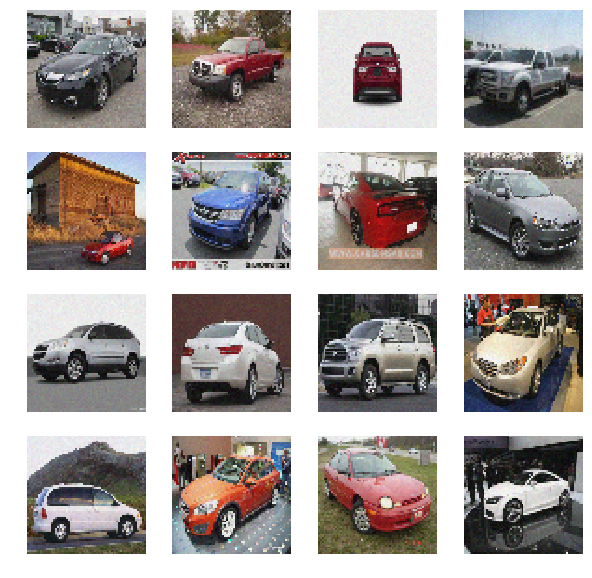

In [25]:
#visualize the preprocessed images

#convert the images back to 0-255 for visualization 
images2 = [cv2.normalize(i, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F).astype(np.uint8) 
           for i in image_noise]
img_col = ImageCollector(np.asarray(images2))
img_col.show(np.asarray(images2))

In [ ]:
# Notebook auto reloads code. (Ref: http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython)
% load_ext autoreload
% autoreload 2
#train the model - generator and discriminator 
from model.dcgan import DCGAN

tf.reset_default_graph()
dcgan = DCGAN()
dcgan.train(image_noise, iters = 8000)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
conv_0_(64, 4, 4, 512)
conv_0_norm_(64, 4, 4, 512)
conv_0_relu_(64, 4, 4, 512)
conv_1_(64, 8, 8, 256)
conv_1_norm_(64, 8, 8, 256)
conv_1_relu_(64, 8, 8, 256)
conv_2_(64, 16, 16, 128)
conv_2_norm_(64, 16, 16, 128)
conv_2_relu_(64, 16, 16, 128)
conv_3_(64, 32, 32, 64)
conv_3_norm_(64, 32, 32, 64)
conv_3_relu_(64, 32, 32, 64)
conv_4_(64, 64, 64, 3)
(64, 64, 64, 3)
(64, 64, 64, 3)
Building my DCGAN
X_train size 8126
new size 8126
Step: 0, D_loss: 1.4901453256607056, G_loss: 0.41930562257766724
Step: 100, D_loss: 0.08119414746761322, G_loss: 7.2404375076293945
Step: 200, D_loss: 1.4069589376449585, G_loss: 7.555228233337402
Step: 300, D_loss: 0.41402125358581543, G_loss: 4.055019855499268
Step: 400, D_loss: 0.5770588517189026, G_loss: 8.012227058410645
Step: 500, D_loss: 0.12409307062625885, G_loss: 5.272353649139404
Step: 600, D_loss: 0.17407479882240295, G_loss: 4.8382134437561035


In [37]:
# show the graph
from cnn_jupyter_tensorboard import show_graph 
tf.reset_default_graph()
with tf.Session() as sess:
    saver = tf.train.import_meta_graph('./checkpoints/DCGAN.ckpt.meta')
    graph = tf.get_default_graph()
    show_graph(graph)
    

In [38]:
tf.train.get_checkpoint_state('checkpoints')

model_checkpoint_path: "checkpoints/DCGAN.ckpt"
all_model_checkpoint_paths: "checkpoints/DCGAN.ckpt"

In [39]:
checkpoint = tf.train.latest_checkpoint('checkpoints')

In [40]:
#Step 1 
#import the model metagraph
saver = tf.train.import_meta_graph('./checkpoints/DCGAN.ckpt.meta', clear_devices=True)
#make that as the default graph
graph = tf.get_default_graph()
input_graph_def = graph.as_graph_def()
sess = tf.Session()
#now restore the variables
saver.restore(sess, "./checkpoints/DCGAN.ckpt")


INFO:tensorflow:Restoring parameters from ./checkpoints/DCGAN.ckpt


In [41]:
#Step 2
# Find the output name
graph = tf.get_default_graph()
for n in graph.as_graph_def().node: 
      print (n.name)

save/RestoreV2/shape_and_slices
save/RestoreV2/tensor_names
save/SaveV2/shape_and_slices
save/SaveV2/tensor_names
save/Const
save/RestoreV2
train_step_1/d_adam/epsilon
train_step_1/d_adam/beta2
train_step_1/d_adam/beta1
train_step_1/d_adam/learning_rate
fc_layer_d/fc_bias/d_fc_bias_1/d_adam_1
save/Assign_67
fc_layer_d/fc_bias/d_fc_bias_1/d_adam_1/read
fc_layer_d/fc_bias/d_fc_bias_1/d_adam_1/Initializer/zeros
fc_layer_d/fc_bias/d_fc_bias_1/d_adam_1/Assign
fc_layer_d/fc_bias/d_fc_bias_1/d_adam
save/Assign_66
fc_layer_d/fc_bias/d_fc_bias_1/d_adam/read
fc_layer_d/fc_bias/d_fc_bias_1/d_adam/Initializer/zeros
fc_layer_d/fc_bias/d_fc_bias_1/d_adam/Assign
fc_layer_d/d_fc_kernel_1/d_adam_1
save/Assign_64
fc_layer_d/d_fc_kernel_1/d_adam_1/read
fc_layer_d/d_fc_kernel_1/d_adam_1/Initializer/zeros/Const
fc_layer_d/d_fc_kernel_1/d_adam_1/Initializer/zeros/shape_as_tensor
fc_layer_d/d_fc_kernel_1/d_adam_1/Initializer/zeros
fc_layer_d/d_fc_kernel_1/d_adam_1/Assign
fc_layer_d/d_fc_kernel_1/d_adam
save/

train_step/gradients/logistic_loss_2/Log1p_grad/Reciprocal
train_step/gradients/logistic_loss_2/Log1p_grad/mul
train_step/gradients/logistic_loss_2/Exp_grad/mul
train_step/gradients/logistic_loss_2/Select_1_grad/Select_1
train_step/gradients/logistic_loss_2/Select_1_grad/Select
train_step/gradients/logistic_loss_2/Select_1_grad/tuple/group_deps
train_step/gradients/logistic_loss_2/Select_1_grad/tuple/control_dependency_1
train_step/gradients/logistic_loss_2/Select_1_grad/tuple/control_dependency
train_step/gradients/logistic_loss_2/Neg_grad/Neg
train_step/gradients/AddN
train_step/gradients/fc_layer_d_1/Add_grad/Sum_1
train_step/gradients/fc_layer_d_1/Add_grad/Reshape_1
train_step/gradients/fc_layer_d_1/Add_grad/Sum
train_step/gradients/fc_layer_d_1/Add_grad/Reshape
train_step/gradients/fc_layer_d_1/Add_grad/tuple/group_deps
train_step/gradients/fc_layer_d_1/Add_grad/tuple/control_dependency_1
train_step/gradients/fc_layer_d_1/Add_grad/tuple/control_dependency
train_step/gradients/fc_l

Generator/batch_norm_2/cond/switch_f_1
Generator/batch_norm_2/cond/switch_t_1
Generator/batch_norm_2/cond/ExponentialMovingAverage/AssignMovingAvg_1/sub/x_1
Generator/batch_norm_2/cond/ExponentialMovingAverage/AssignMovingAvg/sub/x_1
Generator/batch_norm_2/cond/ExponentialMovingAverage/decay_1
Generator/batch_norm_2/cond/ExponentialMovingAverage/AssignMovingAvg_1/sub_2
Generator/batch_norm_2/cond/ExponentialMovingAverage/AssignMovingAvg/sub_2
Generator/batch_norm_1/cond/pred_id_1
Generator/batch_norm_1/cond/Switch_2_1
Generator/batch_norm_1/cond/Switch_1_1
Generator/batch_norm_1/cond/ExponentialMovingAverage/AssignMovingAvg_1/Switch_1
Generator/batch_norm_1/cond/ExponentialMovingAverage/AssignMovingAvg_1/sub_1/Switch_2
Generator/batch_norm_1/cond/ExponentialMovingAverage/AssignMovingAvg/Switch_1
Generator/batch_norm_1/cond/ExponentialMovingAverage/AssignMovingAvg/sub_1/Switch_2
Generator/batch_norm_1/cond/Switch_3
Generator/batch_norm_1/cond/switch_f_1
Generator/batch_norm_1/cond/switc

In [44]:
#Step 3
from tensorflow.python.platform import gfile
from tensorflow.python.framework import graph_util

output_node_names=[v.op.name for v in tf.global_variables()] 

output_graph_def = graph_util.convert_variables_to_constants(
        sess, # The session
        input_graph_def, # input_graph_def is useful for retrieving the nodes 
        output_node_names)    



INFO:tensorflow:Froze 72 variables.
Converted 72 variables to const ops.


In [45]:
#Step 4
#output folder
output_fld ='./'
#output pb file name
output_model_file = 'model.pb'
from tensorflow.python.framework import graph_io
#write the graph
graph_io.write_graph(output_graph_def, output_fld, output_model_file, as_text=False)

'./model.pb'

In [46]:
def loadpb(filename, model_name='dcgan'):
        """Loads pretrained graph from ProtoBuf file
        Arguments:
            filename - path to ProtoBuf graph definition
            model_name - prefix to assign to loaded graph node names
        Returns:
            graph, graph_def - as per Tensorflow definitions
        """
        with tf.gfile.GFile(filename, 'rb') as f:
            graph_def = tf.GraphDef()
            graph_def.ParseFromString(f.read())

        with tf.Graph().as_default() as graph:
            tf.import_graph_def(graph_def,
                                input_map=None,
                                return_elements=None,
                                op_dict=None,
                                producer_op_list=None,
                                name=model_name)

        return graph, graph_def

In [47]:
loadpb('./model.pb',model_name='DCGAN' )

Instructions for updating:
Please file an issue at https://github.com/tensorflow/tensorflow/issues if you depend on this feature.


In [18]:
def add_noise(x, portion, amplitude):
        """
        Add random integer noise to self.x.
        :param portion: The portion of self.x samples to inject noise. If x contains 10000 sample and portion = 0.1,
                        then 1000 samples will be noise-injected.
        :param amplitude: An integer scaling factor of the noise.
        :return added: dataset with noise added
        """
        # TODO: Implement the add_noise function. Remember to record the
        # boolean value is_add_noise. You can try uniform noise or Gaussian
        # noise or others ones that you think appropriate.
        # raise NotImplementedError

        channels = 3
        num_of_samples = len(x)

        for i in range(num_of_samples):
            #in each sample, we need to shift for each channel
            random_boolean = np.random.choice(a=[True, False], size=1, p=[portion, 1-portion])

            if random_boolean == True:
                
                for j in range(channels):

                    mean = 0
                    std = 0.01
                    noise = amplitude * np.random.normal(mean, std, x[i,:,:,j].shape)
                    print(noise)
                    x[i,:,:,j] += noise

        return x 
